## Problem Statement: 
* The timely resolution of customer issues is paramount in IT service management. One of the key performance indicators is the duration in which service requests or tickets are resolved. To improve service delivery, we aim to develop a machine learning model that accurately predicts the duration in which service requests or tickets are closed, leveraging the attributes present in the ServiceNow platform dataset.

### Data description(Meta Data):
1.	number: incident identifier (24,918 different values);
2.	incident state: eight levels controlling the incident management process transitions from opening until closing the case;
3.	active: boolean attribute that shows whether the record is active or closed/cancelled
4.	reassignment_count: number of times the incident has the group or the support analysts changed
5.	reopen_count: number of times the incident resolution was rejected by the caller
6.	sys_mod_count: number of incident updates until that moment
7.	made_sla: boolean attribute that shows whether the incident exceeded the target SLA
8.	caller_id: identifier of the user affected
9.	opened_by: identifier of the user who reported the incident
10.	opened_at: incident user opening date and time
11.	sys_created_by: identifier of the user who registered the incident
12.	sys_created_at: incident system creation date and time
13.	sys_updated_by: identifier of the user who updated the incident and generated the current log record
14.	sys_updated_at: incident system update date and time
15.	contact_type: categorical attribute that shows by what means the incident was reported
16.	location: identifier of the location of the place affected
17.	category: first-level description of the affected service
18.	subcategory: second-level description of the affected service (related to the first level description, i.e., to category)
19.	u_symptom: description of the user perception about service availability
20.	cmdb_ci: (confirmation item) identifier used to report the affected item (not mandatory)
21.	impact: description of the impact caused by the incident (values: 1:“High"; 2:“Medium"; 3:“Low")
22.	urgency: description of the urgency informed by the user for the incident resolution (values: 1:“High";2:“Medium";3:“Low")
23.	priority: calculated by the system based on 'impact' and 'urgency'
24.	assignment_group: identifier of the support group in charge of the incident
25.	assigned_to: identifier of the user in charge of the incident
26.	knowledge: boolean attribute that shows whether a knowledge base document was used to resolve the incident
27.	u_priority_confirmation: Boolean attribute that shows whether the priority field has been double-checked
28.	notify: categorical attribute that shows whether notifications were generated for the incident
29.	problem_id: identifier of the problem associated with the incident
30.	rfc: (request for change) identifier of the change request associated with the incident
31.	vendor: identifier of the vendor in charge of the incident
32.	caused_by: identifier of the RFC responsible by the incident
33.	close_code: identifier of the resolution of the incident
34.	resolved_by: identifier of the user who resolved the incident
35.	resolved_at: incident user resolution date and time
36.	closed_at: incident user close date and time


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df=pd.read_csv('incident_event_log.csv',na_values='?',low_memory=False)

In [3]:
pd.set_option('display.max_columns', 150)
pd.set_option('display.max_rows', 500)

In [4]:
#warnings
import warnings
warnings.filterwarnings('ignore')

In [5]:
df.shape

(141712, 36)

In [6]:
df.head()

,number,incident_state,active,reassignment_count,reopen_count,sys_mod_count,made_sla,caller_id,opened_by,opened_at,sys_created_by,sys_created_at,sys_updated_by,sys_updated_at,contact_type,location,category,subcategory,u_symptom,cmdb_ci,impact,urgency,priority,assignment_group,assigned_to,knowledge,u_priority_confirmation,notify,problem_id,rfc,vendor,caused_by,closed_code,resolved_by,resolved_at,closed_at
0,INC0000045,New,True,0,0,0,True,Caller 2403,Opened by 8,29/2/2016 01:16,Created by 6,29/2/2016 01:23,Updated by 21,29/2/2016 01:23,Phone,Location 143,Category 55,Subcategory 170,Symptom 72,NaN,2 - Medium,2 - Medium,3 - Moderate,Group 56,NaN,True,False,Do Not Notify,NaN,NaN,NaN,NaN,code 5,Resolved by 149,29/2/2016 11:29,5/3/2016 12:00
1,INC0000045,Resolved,True,0,0,2,True,Caller 2403,Opened by 8,29/2/2016 01:16,Created by 6,29/2/2016 01:23,Updated by 642,29/2/2016 08:53,Phone,Location 143,Category 55,Subcategory 170,Symptom 72,NaN,2 - Medium,2 - Medium,3 - Moderate,Group 56,NaN,True,False,Do Not Notify,NaN,NaN,NaN,NaN,code 5,Resolved by 149,29/2/2016 11:29,5/3/2016 12:00
2,INC0000045,Resolved,True,0,0,3,True,Caller 2403,Opened by 8,29/2/2016 01:16,Created by 6,29/2/2016 01:23,Updated by 804,29/2/2016 11:29,Phone,Location 143,Category 55,Subcategory 170,Symptom 72,NaN,2 - Medium,2 - Medium,3 - Moderate,Group 56,NaN,True,False,Do Not Notify,NaN,NaN,NaN,NaN,code 5,Resolved by 149,29/2/2016 11:29,5/3/2016 12:00
3,INC0000045,Closed,False,0,0,4,True,Caller 2403,Opened by 8,29/2/2016 01:16,Created by 6,29/2/2016 01:23,Updated by 908,5/3/2016 12:00,Phone,Location 143,Category 55,Subcategory 170,Symptom 72,NaN,2 - Medium,2 - Medium,3 - Moderate,Group 56,NaN,True,False,Do Not Notify,NaN,NaN,NaN,NaN,code 5,Resolved by 149,29/2/2016 11:29,5/3/2016 12:00
4,INC0000047,New,True,0,0,0,True,Caller 2403,Opened by 397,29/2/2016 04:40,Created by 171,29/2/2016 04:57,Updated by 746,29/2/2016 04:57,Phone,Location 165,Category 40,Subcategory 215,Symptom 471,NaN,2 - Medium,2 - Medium,3 - Moderate,Group 70,Resolver 89,True,False,Do Not Notify,NaN,NaN,NaN,NaN,code 5,Resolved by 81,1/3/2016 09:52,6/3/2016 10:00


#### 1. Changing relevant columns to DateTime format:

In [7]:
df.closed_at=pd.to_datetime(df.closed_at,format='%d/%m/%Y %H:%M')

In [8]:
df.resolved_at=pd.to_datetime(df.resolved_at,format='%d/%m/%Y %H:%M')

In [9]:
df.opened_at=pd.to_datetime(df.opened_at,format='%d/%m/%Y %H:%M')

In [10]:
df.sys_created_at=pd.to_datetime(df.sys_created_at,format='%d/%m/%Y %H:%M')

In [11]:
df.sys_updated_at=pd.to_datetime(df.sys_updated_at,format='%d/%m/%Y %H:%M')

* Calculating Time Delta between: (to create **Potential Dependent Variables**)
    * opened_at & closed_at  -- as a new column: **closed_duration**
    * sys_updated_at & opened_at -- as a new column: **updated_duration**
    
    
* Note: All time delta columns created have values in days (float)

In [12]:
#Diffrence between closed_at & opened_at:
days=(df.closed_at-df.opened_at).dt.components['days']
hour=(df.closed_at-df.opened_at).dt.components['hours']/(24)
minutes=(df.closed_at-df.opened_at).dt.components['minutes']/(24*60)
seconds=(df.closed_at-df.opened_at).dt.components['seconds']/(24*60*60)

df['closed_duration']=days+hour+minutes+seconds

In [13]:
#Diffrence between sys_updated_at & opened_at:
days=(df.sys_updated_at-df.opened_at).dt.components['days']
hour=(df.sys_updated_at-df.opened_at).dt.components['hours']/(24)
minutes=(df.sys_updated_at-df.opened_at).dt.components['minutes']/(24*60)
seconds=(df.sys_updated_at-df.opened_at).dt.components['seconds']/(24*60*60)

df['updated_duration']=days+hour+minutes+seconds

In [14]:
X=df.drop(['closed_duration','updated_duration'],axis=1)
y=df.updated_duration

In [15]:
#Train Test Split:
from sklearn.model_selection import train_test_split
Xtrain, Xtest, ytrain, y_test_final = train_test_split(X,y,test_size=0.2,random_state=42)

In [16]:
#Shape:
Xtrain.shape, Xtest.shape, ytrain.shape, y_test_final.shape

((113369, 36), (28343, 36), (113369,), (28343,))

In [17]:
train=pd.concat([Xtrain,pd.DataFrame(ytrain)],axis=1)
test=pd.concat([Xtest,pd.DataFrame(y_test_final)],axis=1)

In [18]:
test.updated_duration=np.nan

In [19]:
train.shape, test.shape

((113369, 37), (28343, 37))

In [20]:
combined=pd.concat([train,test])

In [21]:
combined.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 141712 entries, 695 to 40904
Data columns (total 37 columns):
 #   Column                   Non-Null Count   Dtype         
---  ------                   --------------   -----         
 0   number                   141712 non-null  object        
 1   incident_state           141712 non-null  object        
 2   active                   141712 non-null  bool          
 3   reassignment_count       141712 non-null  int64         
 4   reopen_count             141712 non-null  int64         
 5   sys_mod_count            141712 non-null  int64         
 6   made_sla                 141712 non-null  bool          
 7   caller_id                141683 non-null  object        
 8   opened_by                136877 non-null  object        
 9   opened_at                141712 non-null  datetime64[ns]
 10  sys_created_by           88636 non-null   object        
 11  sys_created_at           88636 non-null   datetime64[ns]
 12  sys_updated_by 

* Since incident_state has incorrect value, i.e. "-100", replacing it with mode

In [22]:
combined.incident_state.value_counts()

Active                38716
New                   36407
Resolved              25751
Closed                24985
Awaiting User Info    14642
Awaiting Vendor         707
Awaiting Problem        461
Awaiting Evidence        38
-100                      5
Name: incident_state, dtype: int64

In [23]:
combined.incident_state.replace(to_replace='-100',value=combined.incident_state.mode()[0],inplace=True)

#### 2. Removing irrelavant values in the columns:

* Note: Irrelavant meaning repetition of column names in the values (Ex: opened_by has 'opened by 8', extracting only 8 as relevant value)

In [24]:
combined.opened_by=combined.opened_by.str[11:]

combined.resolved_by=combined.resolved_by.str[12:]

combined.caller_id=combined.caller_id.str[7:]

combined.sys_created_by=combined.sys_created_by.str[11:]

combined.sys_updated_by=combined.sys_updated_by.str[11:]

combined.assigned_to=combined.assigned_to.str[9:]

combined.rfc=combined.rfc.str[6:]

combined.location=combined.location.str[9:]

combined.category=combined.category.str[9:]

combined.subcategory=combined.subcategory.str[12:]

combined.u_symptom=combined.u_symptom.str[8:]

combined.assignment_group=combined.assignment_group.str[6:]

combined.closed_code=combined.closed_code.str[5:]

combined.problem_id=combined.problem_id.str[12:]

combined.caused_by=combined.caused_by.str[6:]

combined.cmdb_ci=combined.cmdb_ci.str[8:]

#### 3. Mapping Bool Columns to numeric representations:

* Note: True-1 & False-0

In [25]:
bool_cols=combined.select_dtypes(include='bool').columns
bool_cols

Index(['active', 'made_sla', 'knowledge', 'u_priority_confirmation'], dtype='object')

In [26]:
for i in bool_cols:
    combined[i]=combined[i].map(lambda x: 1 if x==True else 0)

In [27]:
combined.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 141712 entries, 695 to 40904
Data columns (total 37 columns):
 #   Column                   Non-Null Count   Dtype         
---  ------                   --------------   -----         
 0   number                   141712 non-null  object        
 1   incident_state           141712 non-null  object        
 2   active                   141712 non-null  int64         
 3   reassignment_count       141712 non-null  int64         
 4   reopen_count             141712 non-null  int64         
 5   sys_mod_count            141712 non-null  int64         
 6   made_sla                 141712 non-null  int64         
 7   caller_id                141683 non-null  object        
 8   opened_by                136877 non-null  object        
 9   opened_at                141712 non-null  datetime64[ns]
 10  sys_created_by           88636 non-null   object        
 11  sys_created_at           88636 non-null   datetime64[ns]
 12  sys_updated_by 

In [28]:
combined.select_dtypes(include='object').columns

Index(['number', 'incident_state', 'caller_id', 'opened_by', 'sys_created_by',
       'sys_updated_by', 'contact_type', 'location', 'category', 'subcategory',
       'u_symptom', 'cmdb_ci', 'impact', 'urgency', 'priority',
       'assignment_group', 'assigned_to', 'notify', 'problem_id', 'rfc',
       'vendor', 'caused_by', 'closed_code', 'resolved_by'],
      dtype='object')

In [29]:
combined.incident_state.unique()

array(['Closed', 'Active', 'New', 'Resolved', 'Awaiting User Info',
       'Awaiting Vendor', 'Awaiting Evidence', 'Awaiting Problem'],
      dtype=object)

In [30]:
combined.select_dtypes('object').describe().T

,count,unique,top,freq
number,141712,24918,INC0019396,58
incident_state,141712,8,Active,38721
caller_id,141683,5244,1904,1425
opened_by,136877,207,17,41466
sys_created_by,88636,185,10,24223
sys_updated_by,141712,846,908,36162
contact_type,141712,5,Phone,140462
location,141636,224,204,31690
category,141634,58,26,18453
subcategory,141601,254,174,35785


## Univariate Analysis:

In [31]:
num_cols=['reassignment_count', 'reopen_count', 'sys_mod_count', 'updated_duration']

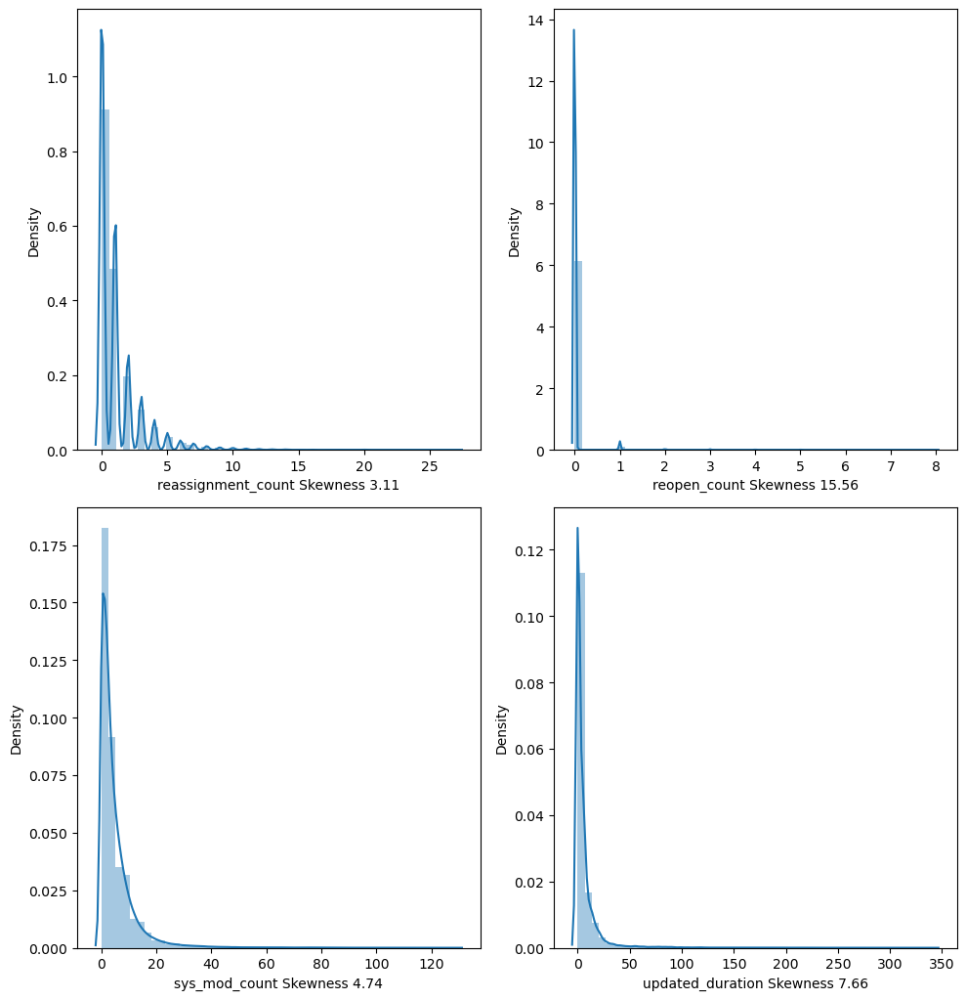

In [32]:
t=1
plt.figure(figsize=(10,15))
for i in num_cols:
    plt.subplot(3,2,t)
    sns.distplot(combined[i])
    plt.xlabel('%s Skewness %.2f'%(i,combined[i].skew()))
    t+=1
plt.tight_layout()
plt.show()

In [33]:
cat_cols=['incident_state', 'contact_type', 'category', 'cmdb_ci', 'impact', 'urgency', 'priority',
       'assignment_group', 'notify', 'vendor', 'caused_by', 'closed_code', 'active',
          'made_sla', 'knowledge', 'u_priority_confirmation']

In [34]:
combined[['incident_state', 'contact_type', 'category', 'cmdb_ci', 'impact', 'urgency', 'priority',
       'assignment_group', 'notify', 'vendor', 'caused_by', 'closed_code']].describe()

,incident_state,contact_type,category,cmdb_ci,impact,urgency,priority,assignment_group,notify,vendor,caused_by,closed_code
count,141712,141712,141634,445,141712,141712,141712,127499,141712,244,23,140998
unique,8,5,58,50,3,3,4,78,2,4,3,17
top,Active,Phone,26,31,2 - Medium,2 - Medium,3 - Moderate,70,Do Not Notify,code 8s,0097,6
freq,38721,140462,18453,32,134335,134094,132452,43474,141593,167,11,86583


In [35]:
#Columns not used for Analysis based on plots are mentioned below as "obj_no_analysis"
#Columns with categorical values exceeding 100 have been excluded from analysis for now.

In [36]:
obj_no_analysis=['number', 'caller_id', 'sys_updated_by', 'u_symptom', 'opened_by', 'sys_created_by', 'location', 
                 'subcategory', 'assigned_to', 'problem_id', 'rfc', 'resolved_by']

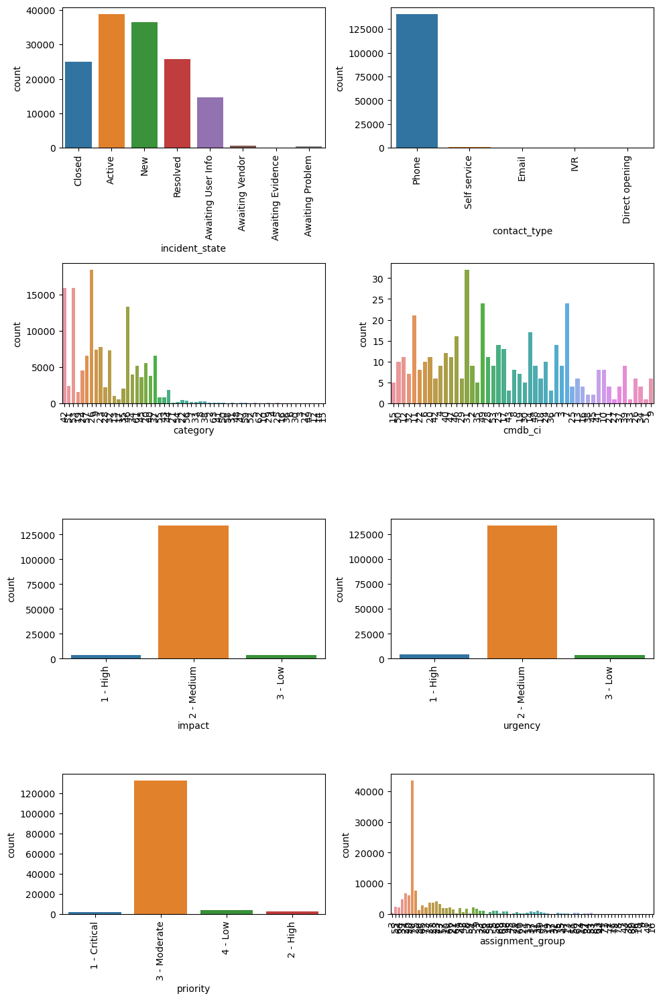

In [37]:
t=1
plt.figure(figsize=(10,15))
for i in cat_cols[:8]:
    plt.subplot(4,2,t)
    plt.xticks(rotation=90)
    sns.countplot(combined[i])
    t+=1
plt.tight_layout()
plt.show()

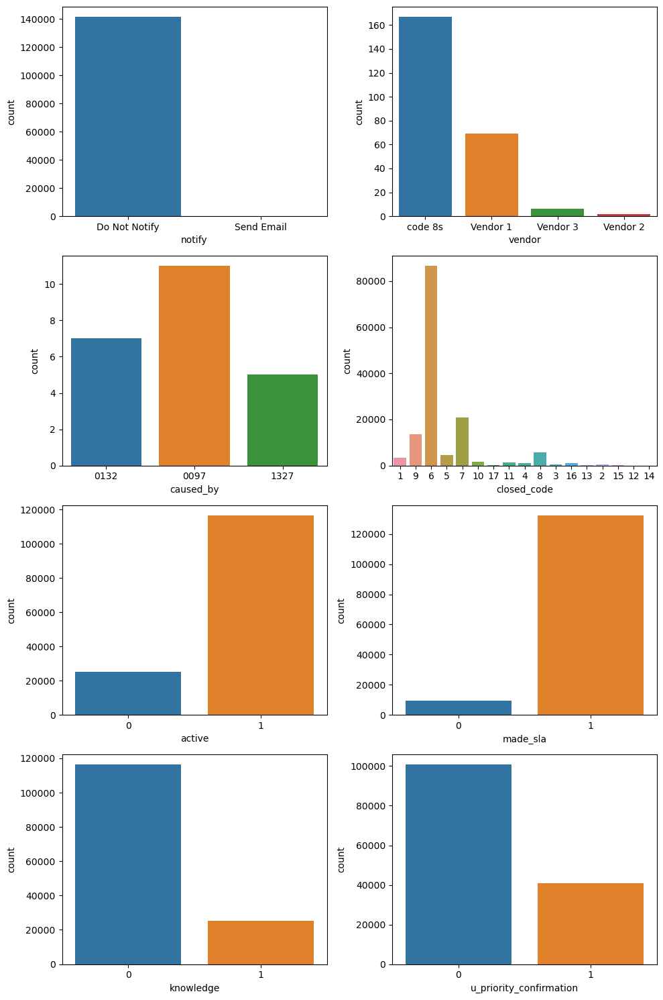

In [38]:
t=1
plt.figure(figsize=(10,15))
for i in cat_cols[8:]:
    plt.subplot(4,2,t)
    sns.countplot(combined[i])
    t+=1
plt.tight_layout()
plt.show()

## Bivariate Analysis:

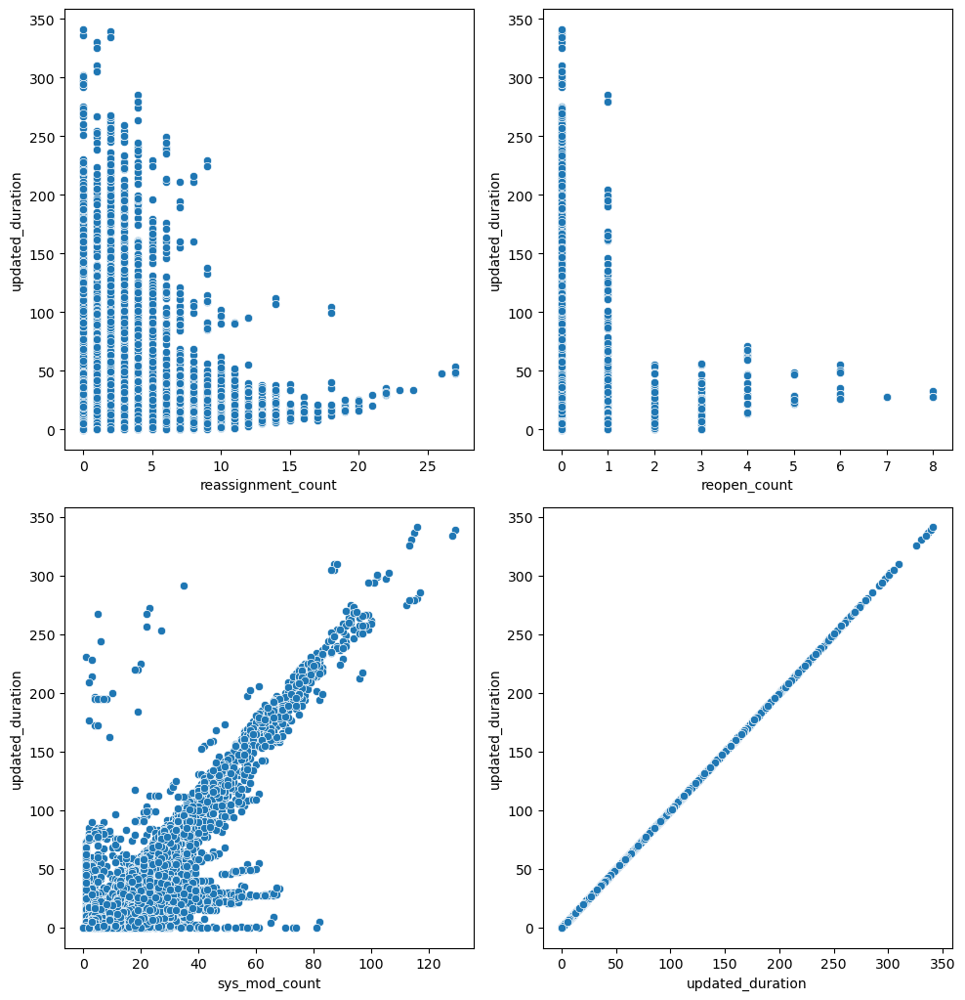

In [39]:
t=1
plt.figure(figsize=(10,15))
for i in num_cols:
    plt.subplot(3,2,t)
    sns.scatterplot(combined[i],combined['updated_duration'])
    t+=1
plt.tight_layout()
plt.show()

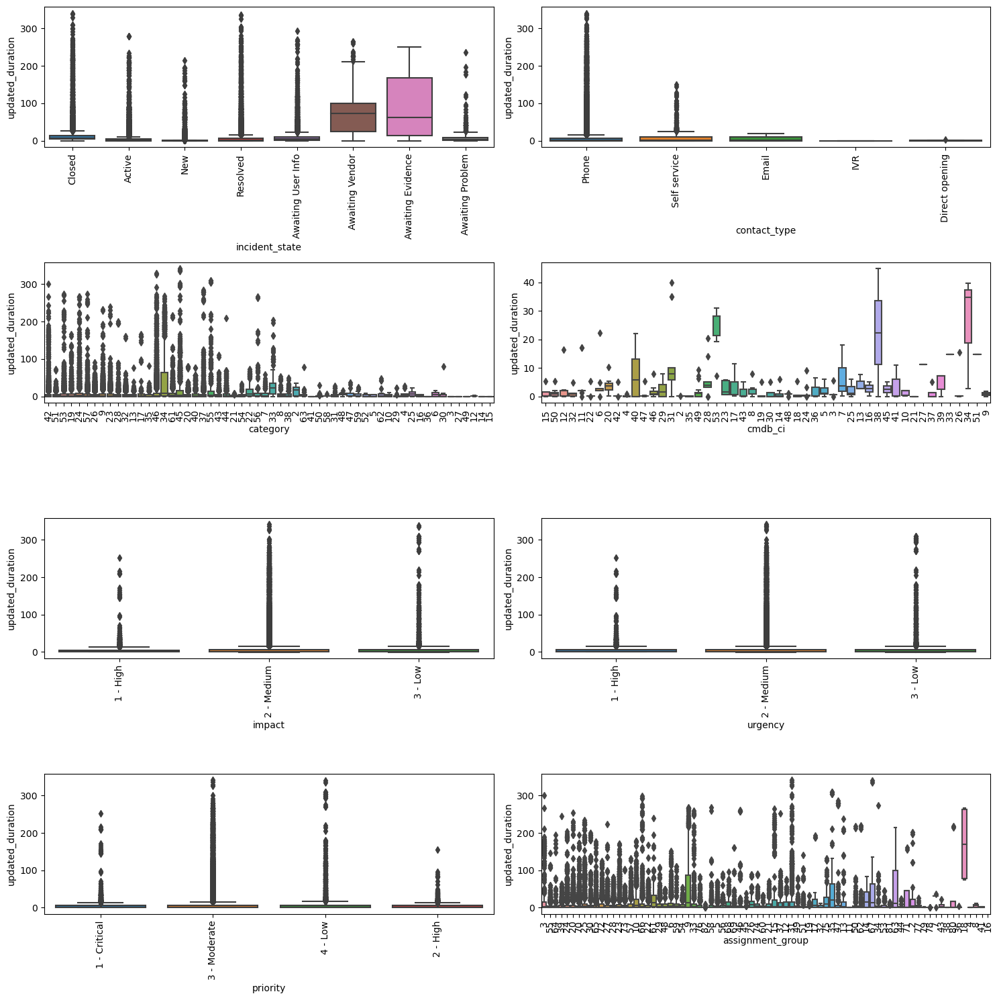

In [40]:
t=1
plt.figure(figsize=(15,15))
for i in cat_cols[:8]:
    plt.subplot(4,2,t)
    sns.boxplot(combined[i],combined['updated_duration'])
    plt.xticks(rotation=90)
    t+=1
plt.tight_layout()
plt.show()

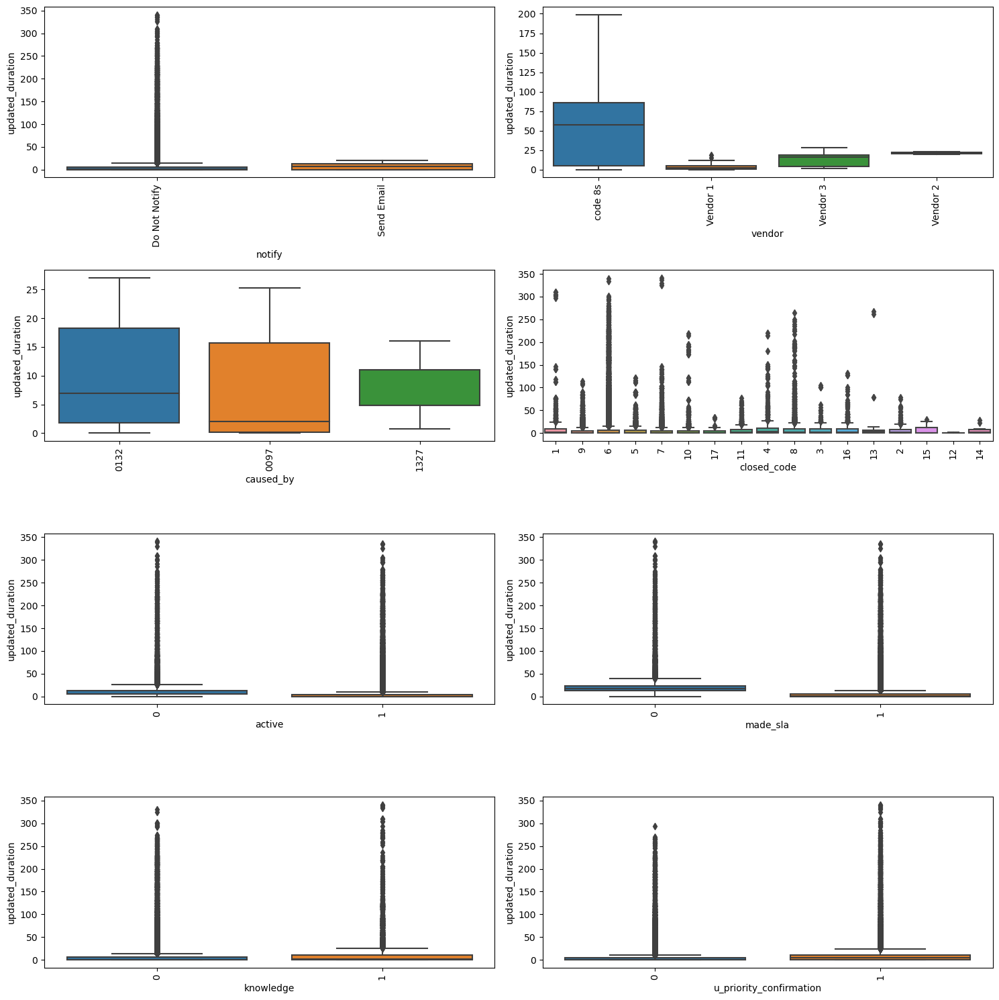

In [41]:
t=1
plt.figure(figsize=(15,15))
for i in cat_cols[8:]:
    plt.subplot(4,2,t)
    sns.boxplot(combined[i],combined['updated_duration'])
    plt.xticks(rotation=90)
    t+=1
plt.tight_layout()
plt.show()

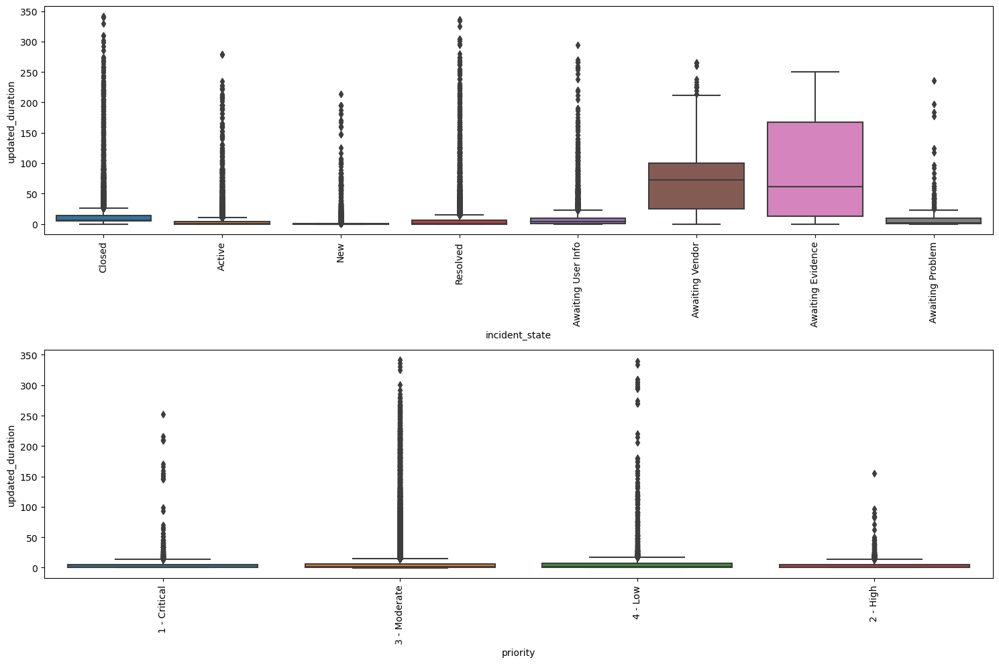

In [42]:
t=1
plt.figure(figsize=(15,10))
for i in ['incident_state','priority']:
    plt.subplot(2,1,t)
    sns.boxplot(combined[i],combined['updated_duration'])
    plt.xticks(rotation=90)
    t+=1
plt.tight_layout()
plt.show()

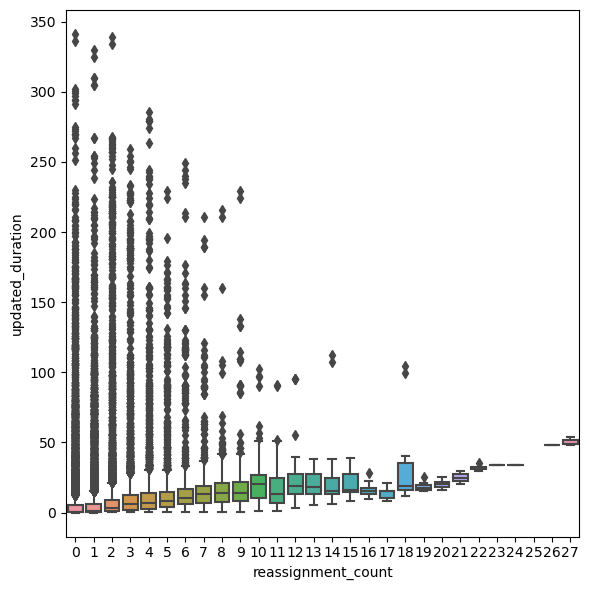

In [43]:
plt.figure(figsize=(6,6))
sns.boxplot(combined.reassignment_count,combined.updated_duration)
plt.tight_layout()
plt.show()

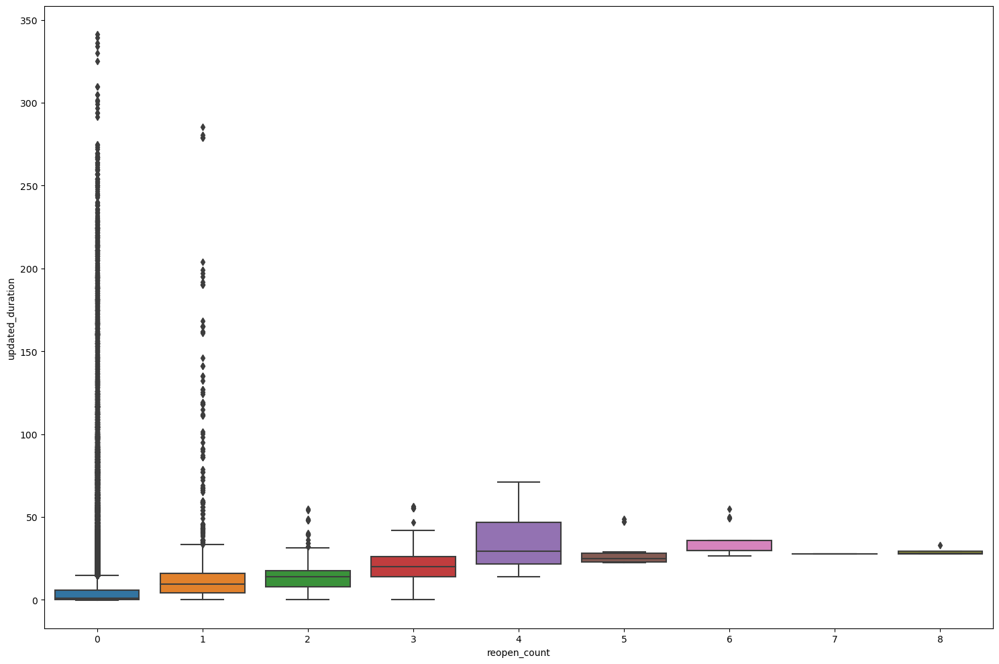

In [44]:
plt.figure(figsize=(15,10))
sns.boxplot(combined.reopen_count,combined.updated_duration)
plt.tight_layout()
plt.show()

##### Relationship between sys_mod_count & updated_duration:

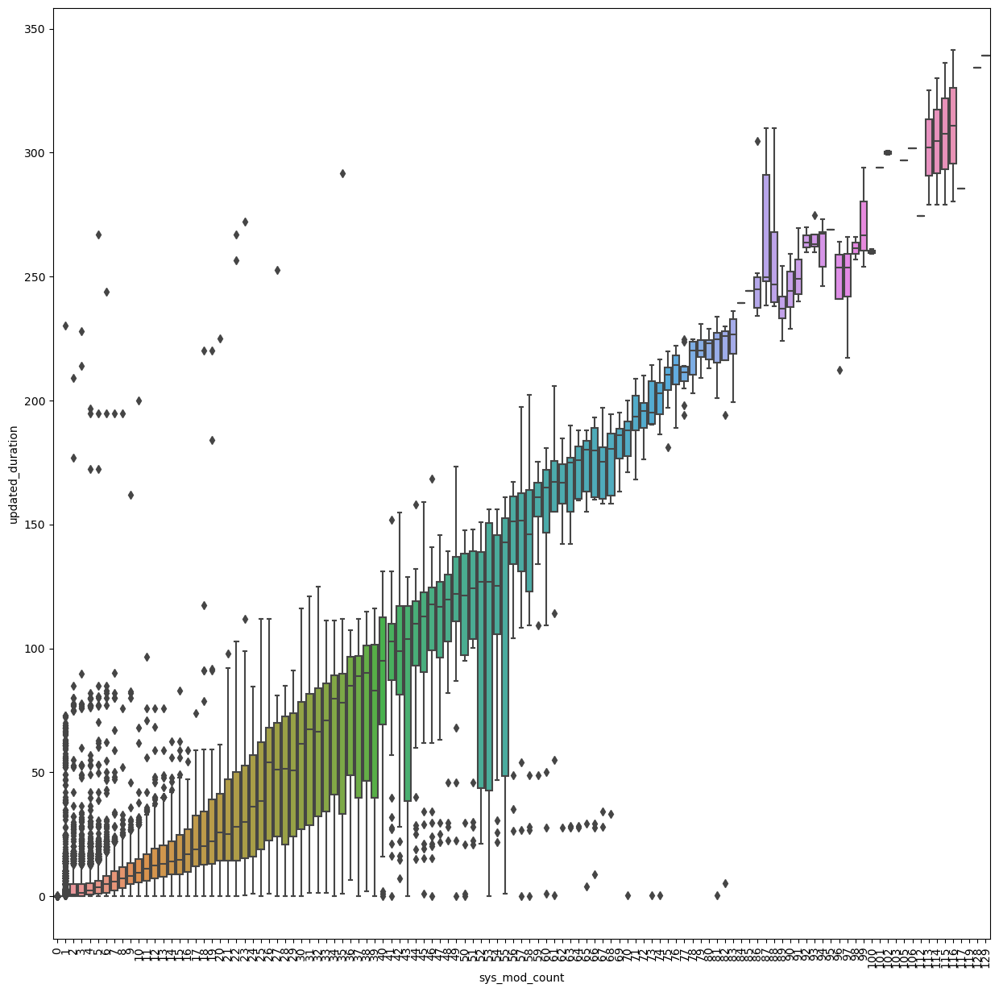

In [45]:
plt.figure(figsize=(15,15))
sns.boxplot(combined.sys_mod_count,combined.updated_duration)
plt.xticks(rotation=90)
plt.show()

In [46]:
combined.sys_mod_count.unique()

array([  7,   0,   3,   1,   9,   5,  18,  15,   2,   4,   6,  10,  26,
         8,  12,  25,  11,  82,  32,  45,  54,  20,  31,  14,  35,  13,
        44,  19,  17,  16,  23,  30,  27,  22,  87,  39,  21,  29,  58,
        42,  37,  38,  78,  74,  64,  28,  52,  34,  46,  71,  70,  55,
        33,  41,  68,  43,  62,  53,  24,  36,  47,  59,  93,  75,  40,
        57, 115,  50,  56,  83,  79,  66,  49,  69,  81,  60,  63,  76,
        91,  72,  48,  65, 102,  73,  61,  67,  51, 114,  77,  90, 105,
        96,  94, 116, 129,  92,  80,  89,  99, 101, 100,  88, 106,  84,
       117, 113,  86, 112,  85,  98,  97,  95, 128, 119, 103], dtype=int64)

In [47]:
list_sys_mod_count=list(combined.sys_mod_count.unique())

In [48]:
combined.groupby('sys_mod_count')['updated_duration'].describe()

,count,mean,std,min,25%,50%,75%,max
sys_mod_count,,,,,,,,
0,19916.0,0.003515,0.008012,-0.102083,0.000000,0.000694,0.004167,0.237500
1,17709.0,0.895868,4.358626,0.000000,0.005556,0.016667,0.156944,230.288889
2,15704.0,2.157212,4.081973,-0.075694,0.034722,0.675000,5.014583,209.053472
3,11325.0,2.769146,4.870603,0.000694,0.158333,1.193056,5.027083,228.091667
4,8568.0,3.710663,5.965443,0.000694,0.601563,2.240972,5.282118,196.702778
5,6918.0,4.581662,6.674423,0.002083,0.977778,3.529861,6.339931,266.911111
6,5647.0,5.796270,6.791060,0.002083,1.427778,5.056944,8.029861,244.025694
7,4498.0,7.044564,6.596407,-0.012500,2.311979,6.027083,10.081597,194.886806
8,3745.0,8.081183,6.644441,0.002778,3.275694,7.038194,11.865972,194.892361


##### Creating bins in sys_mod_count to see if there is a dependency of sys_mod_count on updated_duration:

In [49]:
list_sys_mod_count=list(combined.sys_mod_count.unique())

In [50]:
for i in list_sys_mod_count:
    combined['bins_sys_mod_count']=combined.sys_mod_count.map(lambda x: 1 if x<13 else 2 if x<26 else 3 if x<39 else 4 if x<52 else 5 if x<65 else 6 if x<78 else 7 if x<91 else 8 if x<104 else 9 if x<117 else 10)

In [51]:
combined.groupby(by='bins_sys_mod_count')['updated_duration'].mean()

bins_sys_mod_count
1       3.314542
2      22.044991
3      56.587744
4      94.460508
5     131.589686
6     180.824924
7     225.671452
8     261.701426
9     302.115341
10    319.585417
Name: updated_duration, dtype: float64

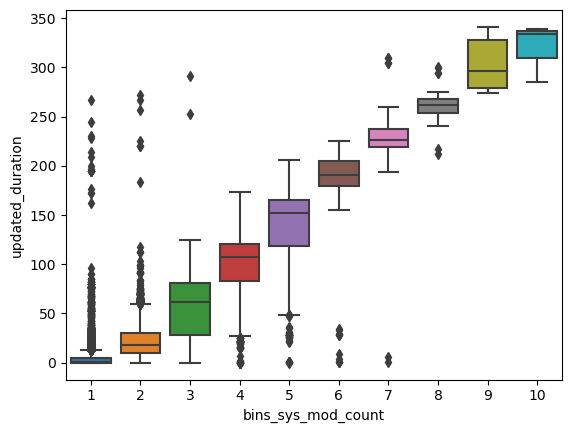

In [52]:
sns.boxplot(combined.bins_sys_mod_count,combined.updated_duration)
plt.show()

In [53]:
#Checking for correlation of bins created for sys_mod_count:
combined.bins_sys_mod_count.corr(combined.updated_duration)

0.8404510945977636

<AxesSubplot:ylabel='Frequency'>

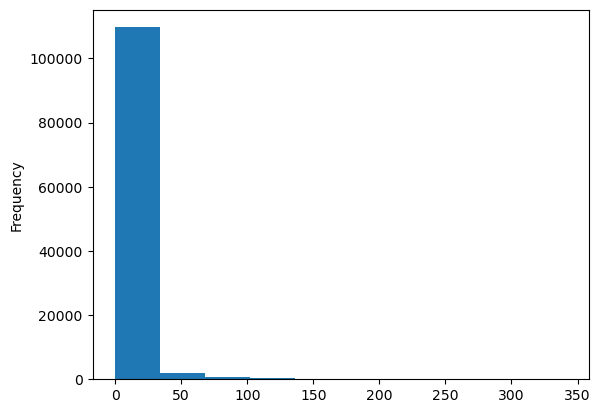

In [54]:
combined.updated_duration.plot(kind='hist')

In [55]:
combined.updated_duration.skew()

7.661954465544358

### Missing Value Treatment:

In [56]:
combined.isnull().sum()

number                          0
incident_state                  0
active                          0
reassignment_count              0
reopen_count                    0
sys_mod_count                   0
made_sla                        0
caller_id                      29
opened_by                    4835
opened_at                       0
sys_created_by              53076
sys_created_at              53076
sys_updated_by                  0
sys_updated_at                  0
contact_type                    0
location                       76
category                       78
subcategory                   111
u_symptom                   32964
cmdb_ci                    141267
impact                          0
urgency                         0
priority                        0
assignment_group            14213
assigned_to                 27496
knowledge                       0
u_priority_confirmation         0
notify                          0
problem_id                 139417
rfc           

In [57]:
#Caller_id: mode imputation
combined.caller_id.mode()[0]

'1904'

In [58]:
combined['caller_id'].replace(to_replace=np.nan,value=combined.caller_id.mode()[0],inplace=True)

In [59]:
#Opened_by: mode imputation
combined['opened_by'].replace(to_replace=np.nan,value=combined.opened_by.mode()[0],inplace=True)

In [60]:
#sys_created_by:
#Imputing with mode & creating a column 'sys_created_imputed' to add weight to the imputation, as missing values are ~37%

In [61]:
combined['sys_created_imputed']=combined.sys_created_by.isnull().map({True:1,False:0})

In [62]:
combined.sys_created_by.fillna(combined.sys_created_by.mode()[0],inplace=True)

In [63]:
#sys_created_at:
#Imputing opened_at time: as difference between opened_at & sys_created_at is under 1 day:
combined.sys_created_at.fillna(combined.opened_at,inplace=True)

In [64]:
#location: mode imputation
combined.location.fillna(combined.location.mode()[0],inplace=True)

In [65]:
#Category: mode imputation
combined.category.fillna(combined.category.mode()[0],inplace=True)

In [66]:
#Subcategory: mode imputation
combined.subcategory.fillna(combined.subcategory.mode()[0],inplace=True)

In [67]:
#u_symptom:
#Imputing with mode & creating a column 'u_symptom_imputed' to add weight to the imputation, as missing values are ~23%
combined['u_symptom_imputed']=combined.u_symptom.isnull().map({True:1,False:0})

In [68]:
combined.u_symptom.fillna(combined.u_symptom.mode()[0],inplace=True)

In [69]:
#cmdb_ci: As the value is NOT MANDATORY, using factorize to handle missing values:
combined.cmdb_ci=pd.factorize(combined.cmdb_ci)[0]

In [70]:
#assignment_group:
#Imputing with mode & creating a column 'assignment_group_imputed' to add weight to the imputation, as missing values are ~10%
combined['assignment_group_imputed']=combined.assignment_group.isnull().map({True:1,False:0})

In [71]:
combined.assignment_group.fillna(combined.assignment_group.mode()[0],inplace=True)

In [72]:
#assigned_to:
#Imputing with mode & creating a column 'assignment_to_imputed' to add weight to the imputation, as missing values are ~19%
combined['assigned_to_imputed']=combined.assigned_to.isnull().map({True:1,False:0})

In [73]:
combined.assigned_to.fillna(combined.assigned_to.mode()[0],inplace=True)

In [74]:
#problem_id: Encoding with factorize to handling missing values
combined.problem_id=pd.factorize(combined.problem_id)[0]

In [75]:
#caused_by & rfc has same values, hence we drop caused_by as it has more missing values.
#Handling missing values in rfc

In [76]:
combined.drop('caused_by',axis=1,inplace=True)

In [77]:
#rfc: Encoding with factorize to handling missing values
combined.rfc=pd.factorize(combined.rfc)[0]

In [78]:
#vendor: Encoding with factorize to handling missing values
combined.vendor=pd.factorize(combined.vendor)[0]

In [79]:
#closed_code: mode imputation
combined.closed_code.fillna(combined.closed_code.mode()[0],inplace=True)

In [80]:
#resolved_by: mode imputation
combined.resolved_by.fillna(combined.resolved_by.mode()[0],inplace=True)

In [81]:
(combined.closed_at-combined.resolved_at).dt.days.median()

5.0

In [82]:
#resolved_at:
#Imputing closed_at time: as difference is low between closed_at & resolved_at is under 5 days (compared to max value of 341 days):
combined.resolved_at.fillna(combined.closed_at,inplace=True)

### Hypothesis Testing:

In [83]:
obj_no_analysis

['number',
 'caller_id',
 'sys_updated_by',
 'u_symptom',
 'opened_by',
 'sys_created_by',
 'location',
 'subcategory',
 'assigned_to',
 'problem_id',
 'rfc',
 'resolved_by']

In [84]:
#Hypothesis Testing for Categorical Columns:

In [85]:
hyp_cols=['incident_state', 'active', 'made_sla', 'caller_id', 'opened_by',
       'sys_created_by', 'sys_updated_by',
       'contact_type', 'location', 'category', 'subcategory',
       'u_symptom', 'cmdb_ci', 'impact', 'urgency', 'priority',
       'assignment_group', 'assigned_to', 'knowledge',
       'u_priority_confirmation', 'notify', 'problem_id', 'rfc', 'vendor',
       'closed_code', 'resolved_by', 'bins_sys_mod_count', 'sys_created_imputed',
       'u_symptom_imputed', 'assignment_group_imputed', 'assigned_to_imputed','bins_sys_mod_count']

In [86]:
#Ho: Variable is not significant for our model.
#Ha: Varible is significant for our model.

In [87]:
from scipy.stats import kruskal

In [88]:
import scipy.stats as stats

In [89]:
stats_train=combined.loc[train.index,:]

In [90]:
#Check for normality of numeric data:
teststat, pval = stats.shapiro(df.updated_duration)

if pval<0.05:
    print('Data is NOT normal')
else:
    print('Data is normal')

Data is NOT normal


#As Data is **NOT normal**, we will use **Non-Parametric tests**: Kruskal walis for categorical features & MannWhitneyU for Numerical features

In [91]:
hyp_significant_cols=[]
for i in hyp_cols:
    groups = stats_train[i].unique()
    data = [stats_train[stats_train[i] == group]['updated_duration'] for group in groups]
    statistic, pvalue = kruskal(*data)
    if pvalue<0.05:
        print("We reject the Null Hypothesis.",i,"is a significant variable for our Model with pvalue:",np.round(pvalue,2))
        hyp_significant_cols.append(i)
    else:
        print("We FAIL to reject the Null Hypothesis.",i,"is NOT a significant variable for our Model with pvalue:",np.round(pvalue,2))

We reject the Null Hypothesis. incident_state is a significant variable for our Model with pvalue: 0.0
We reject the Null Hypothesis. active is a significant variable for our Model with pvalue: 0.0
We reject the Null Hypothesis. made_sla is a significant variable for our Model with pvalue: 0.0
We reject the Null Hypothesis. caller_id is a significant variable for our Model with pvalue: 0.0
We reject the Null Hypothesis. opened_by is a significant variable for our Model with pvalue: 0.0
We reject the Null Hypothesis. sys_created_by is a significant variable for our Model with pvalue: 0.0
We reject the Null Hypothesis. sys_updated_by is a significant variable for our Model with pvalue: 0.0
We reject the Null Hypothesis. contact_type is a significant variable for our Model with pvalue: 0.0
We reject the Null Hypothesis. location is a significant variable for our Model with pvalue: 0.0
We reject the Null Hypothesis. category is a significant variable for our Model with pvalue: 0.0
We rejec

In [92]:
#Numerical Columns:
hyp_cols_num=['reassignment_count', 'reopen_count', 'sys_mod_count']

In [93]:
for i in hyp_cols_num:
    teststat, pvalue=stats.mannwhitneyu(df[i],df.updated_duration)
    if pvalue<0.05:
        print("We reject the Null Hypothesis.",i,"is a significant variable for our Model with pvalue:",np.round(pvalue,2))
        hyp_significant_cols.append(i)
    else:
        print("We FAIL to reject the Null Hypothesis.",i,"is NOT a significant variable for our Model with pvalue:",np.round(pvalue,2))

We reject the Null Hypothesis. reassignment_count is a significant variable for our Model with pvalue: 0.0
We reject the Null Hypothesis. reopen_count is a significant variable for our Model with pvalue: 0.0
We reject the Null Hypothesis. sys_mod_count is a significant variable for our Model with pvalue: 0.0


#### Target variable with incorrect values:

In [94]:
combined[combined.updated_duration<0]

,number,incident_state,active,reassignment_count,reopen_count,sys_mod_count,made_sla,caller_id,opened_by,opened_at,sys_created_by,sys_created_at,sys_updated_by,sys_updated_at,contact_type,location,category,subcategory,u_symptom,cmdb_ci,impact,urgency,priority,assignment_group,assigned_to,knowledge,u_priority_confirmation,notify,problem_id,rfc,vendor,closed_code,resolved_by,resolved_at,closed_at,updated_duration,bins_sys_mod_count,sys_created_imputed,u_symptom_imputed,assignment_group_imputed,assigned_to_imputed
344,INC0000134,New,1,0,0,2,1,2471,501,2016-02-29 09:44:00,62,2016-02-29 07:46:00,265,2016-02-29 07:55:00,Phone,204,62,192,580,-1,3 - Low,3 - Low,4 - Low,72,216,1,0,Do Not Notify,-1,-1,-1,8,180,2016-03-03 08:21:00,2016-03-08 09:00:00,-0.075694,1,0,0,0,0
349,INC0000135,Active,1,0,0,7,1,5331,40,2016-02-29 09:45:00,62,2016-02-29 07:46:00,653,2016-02-29 09:27:00,Phone,204,53,271,470,-1,2 - Medium,2 - Medium,3 - Moderate,70,216,1,0,Do Not Notify,-1,-1,-1,9,32,2016-02-29 16:17:00,2016-03-05 17:00:00,-0.012500,1,0,0,0,0
334,INC0000131,Active,1,0,0,0,1,3763,433,2016-02-29 09:41:00,62,2016-02-29 07:14:00,265,2016-02-29 07:14:00,Phone,15,45,220,580,-1,2 - Medium,2 - Medium,3 - Moderate,66,175,1,0,Do Not Notify,-1,-1,-1,2,184,2016-03-03 09:27:00,2016-03-08 10:00:00,-0.102083,1,0,0,0,0


In [95]:
combined[combined.updated_duration<0].index

Int64Index([344, 349, 334], dtype='int64')

In [96]:
combined.drop(index=[344, 349, 334],inplace=True)

In [97]:
train.drop(index=[344, 349, 334],inplace=True)

In [98]:
combined[(combined.updated_duration==0)]

,number,incident_state,active,reassignment_count,reopen_count,sys_mod_count,made_sla,caller_id,opened_by,opened_at,sys_created_by,sys_created_at,sys_updated_by,sys_updated_at,contact_type,location,category,subcategory,u_symptom,cmdb_ci,impact,urgency,priority,assignment_group,assigned_to,knowledge,u_priority_confirmation,notify,problem_id,rfc,vendor,closed_code,resolved_by,resolved_at,closed_at,updated_duration,bins_sys_mod_count,sys_created_imputed,u_symptom_imputed,assignment_group_imputed,assigned_to_imputed
103798,INC0025160,Resolved,1,0,0,0,1,290,20,2016-05-02 22:03:00,10,2016-05-02 22:03:00,908,2016-05-02 22:03:00,Phone,188,28,174,491,-1,3 - Low,3 - Low,4 - Low,70,15,0,0,Do Not Notify,-1,-1,-1,6,13,2016-05-07 22:07:00,2016-05-07 22:07:00,0.0,1,1,0,0,0
36385,INC0008100,New,1,0,0,0,1,4353,8,2016-03-17 08:48:00,10,2016-03-17 08:48:00,908,2016-03-17 08:48:00,Phone,38,32,9,491,-1,2 - Medium,2 - Medium,3 - Moderate,70,17,0,0,Do Not Notify,-1,-1,-1,6,5,2016-03-17 08:54:00,2016-03-24 19:01:00,0.0,1,1,1,0,1
134249,INC0032873,New,1,0,0,0,1,4979,17,2016-05-25 09:19:00,10,2016-05-25 09:19:00,908,2016-05-25 09:19:00,Phone,93,42,223,491,-1,2 - Medium,2 - Medium,3 - Moderate,70,17,0,0,Do Not Notify,-1,-1,-1,7,11,2016-05-25 09:39:00,2016-05-30 10:07:00,0.0,1,1,1,0,1
134038,INC0032813,New,1,0,0,0,1,4922,17,2016-05-25 08:26:00,10,2016-05-25 08:26:00,908,2016-05-25 08:26:00,Phone,143,24,164,491,-1,2 - Medium,2 - Medium,3 - Moderate,28,17,0,0,Do Not Notify,-1,-1,-1,6,111,2016-05-27 14:19:00,2016-06-01 15:07:00,0.0,1,1,1,0,1
38387,INC0008559,New,1,0,0,0,1,112,40,2016-03-18 08:24:00,10,2016-03-18 08:24:00,908,2016-03-18 08:24:00,Phone,128,53,174,491,-1,2 - Medium,2 - Medium,3 - Moderate,27,17,0,0,Do Not Notify,-1,-1,-1,6,11,2016-03-21 12:04:00,2016-03-26 12:59:00,0.0,1,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93426,INC0022538,New,1,0,0,0,1,2937,58,2016-04-25 19:58:00,10,2016-04-25 19:58:00,908,2016-04-25 19:58:00,Phone,128,9,174,491,-1,2 - Medium,2 - Medium,3 - Moderate,70,17,0,0,Do Not Notify,-1,-1,-1,6,29,2016-04-25 20:10:00,2016-04-30 21:07:00,0.0,1,1,0,0,1
98806,INC0023918,New,1,0,0,0,1,3768,47,2016-04-28 19:23:00,10,2016-04-28 19:23:00,908,2016-04-28 19:23:00,Phone,51,54,195,533,-1,2 - Medium,2 - Medium,3 - Moderate,76,17,0,0,Do Not Notify,-1,-1,-1,6,220,2016-04-29 11:43:00,2016-05-04 12:07:00,0.0,1,1,0,0,1
38044,INC0008475,New,1,0,0,0,1,123,108,2016-03-17 17:16:00,10,2016-03-17 17:16:00,908,2016-03-17 17:16:00,Phone,161,32,9,491,-1,2 - Medium,2 - Medium,3 - Moderate,70,17,0,0,Do Not Notify,-1,-1,-1,6,52,2016-03-17 17:31:00,2016-03-24 19:02:00,0.0,1,1,0,0,1
82798,INC0019823,Active,1,0,0,0,1,1607,17,2016-04-15 14:19:00,10,2016-04-15 14:19:00,908,2016-04-15 14:19:00,Phone,33,42,223,534,-1,2 - Medium,2 - Medium,3 - Moderate,70,13,0,0,Do Not Notify,-1,-1,-1,7,11,2016-04-15 14:30:00,2016-04-20 15:07:00,0.0,1,1,0,0,0


#### Encoding/Feature Engineering:

In [99]:
combined.select_dtypes(include='object').describe()

,number,incident_state,caller_id,opened_by,sys_created_by,sys_updated_by,contact_type,location,category,subcategory,u_symptom,impact,urgency,priority,assignment_group,assigned_to,notify,closed_code,resolved_by
count,141709,141709,141709,141709,141709,141709,141709,141709,141709,141709,141709,141709,141709,141709,141709,141709,141709,141709,141709
unique,24918,8,5244,207,185,846,5,224,58,254,525,3,3,4,78,234,2,17,216
top,INC0019396,Active,1904,17,10,908,Phone,204,26,174,491,2 - Medium,2 - Medium,3 - Moderate,70,17,Do Not Notify,6,15
freq,58,38719,1454,46301,77299,36162,140459,31764,18531,35896,84949,134333,134092,132450,57686,38086,141590,87297,15647


In [100]:
#incident_state: drop_first - NO
#contact_type: drop_first - YES
#category: encoding - target, median, mean
#subcategory: encoding - target, median, mean
#u_symptom: encoding - target, median, mean
#assignment_group: encoding - target, median, mean
#assigned_to: encoding - target, median, mean
#closed_code: encoding - target, median, mean, std
#resolved_by: encoding - target, median, mean
#location: encoding - target, median, mean

In [101]:
combined.incident_state.value_counts()

Active                38719
New                   36406
Resolved              25751
Closed                24985
Awaiting User Info    14642
Awaiting Vendor         707
Awaiting Problem        461
Awaiting Evidence        38
Name: incident_state, dtype: int64

In [102]:
combined['impact_map']=combined.impact.map({'3 - Low':0,'2 - Medium':1,'1 - High':2})

In [103]:
combined['urgency_map']=combined.urgency.map({'3 - Low':0,'2 - Medium':1,  '1 - High':2})

In [104]:
combined['impact_urgency']=combined.impact_map+combined.urgency_map

In [105]:
combined['priority_map']=combined.priority.map({'4 - Low':0,'3 - Moderate':1, '2 - High':2, '1 - Critical':3})

In [106]:
combined.groupby('problem_id')['updated_duration'].describe()

,count,mean,std,min,25%,50%,75%,max
problem_id,,,,,,,,
-1,111522.0,6.464352,17.878448,0.000000,0.010417,1.009028,5.978472,341.275694
0,7.0,0.075794,0.088570,0.002778,0.015972,0.043750,0.124306,0.203472
1,114.0,2.681287,3.644076,0.000694,0.025694,0.864236,5.351562,19.000000
2,27.0,3.736857,4.267415,0.002083,0.114583,1.136111,6.260764,12.202778
3,7.0,0.751885,1.910058,0.008333,0.018056,0.045139,0.045139,5.083333
4,9.0,4.347454,3.243794,0.004861,3.651389,4.675000,5.772917,10.789583
5,7.0,6.333829,6.384578,0.001389,0.208681,6.862500,10.521528,16.012500
6,68.0,1.662725,2.313910,0.001389,0.026562,0.876042,1.957639,7.075694
7,4.0,0.044271,0.058469,0.000000,0.011979,0.023611,0.055903,0.129861


In [107]:
combined.groupby('problem_id')['category'].describe()

,count,unique,top,freq
problem_id,,,,
-1,139414,58,26,18335
0,8,1,42,8
1,147,5,53,111
2,34,1,57,34
3,8,1,23,8
4,10,1,46,10
5,7,1,46,7
6,82,1,26,82
7,7,2,42,5


In [108]:
combined.problem_id.value_counts()

-1      139414
 9         184
 1         147
 6          82
 33         48
 92         40
 2          34
 44         33
 47         29
 24         28
 19         26
 17         24
 32         21
 16         21
 54         21
 58         20
 68         18
 148        17
 30         16
 162        16
 50         16
 97         15
 85         15
 39         15
 138        15
 27         15
 80         14
 83         14
 49         14
 104        14
 134        14
 149        14
 51         13
 115        13
 82         13
 102        13
 38         12
 187        12
 74         12
 206        12
 63         11
 163        11
 154        11
 107        11
 142        11
 53         11
 120        11
 129        11
 18         11
 10         11
 28         11
 13         11
 11         11
 86         10
 20         10
 146        10
 22         10
 90         10
 150        10
 14         10
 70         10
 67         10
 171        10
 4          10
 113        10
 175         9
 192      

In [109]:
combined['problem_id_median']=combined.groupby('problem_id')['updated_duration'].transform('median')

In [110]:
combined['prob_priority_metric']=combined.problem_id_median*combined.priority_map

In [111]:
combined['prob_impact_urgency_metric']=combined.problem_id_median*combined.impact_urgency

In [112]:
combined['rfc_map']=combined.rfc.apply(lambda x: 0 if x==-1 else 1)

In [113]:
combined.groupby('bins_sys_mod_count')['updated_duration'].describe()

,count,mean,std,min,25%,50%,75%,max
bins_sys_mod_count,,,,,,,,
1,103311.0,3.314640,6.066249,0.000000,0.008333,0.671528,5.039583,266.911111
2,7524.0,22.044991,17.083735,0.002083,10.232813,17.859722,30.068576,272.115972
3,1483.0,56.587744,30.482460,0.002083,28.049653,62.143750,81.067361,291.625694
4,493.0,94.460508,38.926331,0.001389,83.229861,106.989583,120.944444,173.314583
5,257.0,131.589686,51.111567,0.172917,118.242361,151.950000,164.867361,205.845833
6,164.0,180.824924,46.860511,0.225694,179.888889,190.637500,205.334722,224.734722
7,83.0,225.671452,41.359224,0.266667,219.137500,226.064583,237.809028,309.762500
8,37.0,261.701426,18.090219,212.329861,254.116667,262.240972,268.056944,300.857639
9,11.0,302.115341,26.237774,274.345833,279.065972,296.761806,327.654514,341.275694


In [114]:
combined['sys_mod_count_median']=combined.groupby('bins_sys_mod_count')['updated_duration'].transform('median')
combined['sys_mod_count_mean']=combined.groupby('bins_sys_mod_count')['updated_duration'].transform('mean')
combined['sys_mod_count_min']=combined.groupby('bins_sys_mod_count')['updated_duration'].transform('min')
combined['sys_mod_count_max']=combined.groupby('bins_sys_mod_count')['updated_duration'].transform('max')
combined['sys_mod_count_count']=combined.groupby('bins_sys_mod_count')['updated_duration'].transform('count')
combined['sys_mod_count_nunique']=combined.groupby('bins_sys_mod_count')['updated_duration'].transform('nunique')

In [115]:
combined.groupby('category')['updated_duration'].describe()

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
10,17.0,2.760825,3.297253,0.000000,0.007639,1.900000,4.815278,10.001389
12,2.0,1.113542,1.573804,0.000694,0.557118,1.113542,1.669965,2.226389
13,786.0,3.438140,5.428641,0.000000,0.030729,1.080556,5.184896,77.022917
14,3.0,0.001389,0.001203,0.000694,0.000694,0.000694,0.001736,0.002778
15,1.0,0.006250,NaN,0.006250,0.006250,0.006250,0.006250,0.006250
16,5.0,2.069861,2.804778,0.002083,0.002083,0.061111,5.095139,5.188889
17,405.0,6.593940,22.028882,0.000000,0.018056,0.813194,5.687500,165.752083
19,1280.0,8.293778,19.069591,0.000000,0.033160,0.990625,6.751389,165.979167
2,68.0,14.464808,11.442768,0.000000,0.113194,16.835764,23.800174,35.765278


In [116]:
combined.groupby('subcategory')['updated_duration'].describe()

,count,mean,std,min,25%,50%,75%,max
subcategory,,,,,,,,
10,45.0,1.028380,1.998611,0.000000,0.000000,0.002083,1.106944,8.071528
100,11.0,6.663636,5.382220,0.000000,3.284722,5.175000,10.176389,17.450694
101,78.0,9.831099,14.447139,0.000000,0.052604,1.029861,13.668229,53.945833
102,23.0,11.059481,24.570302,0.000000,0.026389,3.349306,7.652431,89.918750
103,1205.0,2.796158,5.195628,0.000000,0.008333,0.333333,5.019444,80.063889
104,10.0,0.807708,0.799401,0.015278,0.034722,0.768056,1.584549,1.868056
105,193.0,4.415468,6.882639,0.000000,0.007639,1.100000,5.722917,34.678472
106,151.0,6.017586,9.579917,0.000000,0.010069,0.898611,9.464583,46.905556
107,368.0,5.879320,17.020451,0.000000,0.011111,0.639236,5.426562,228.091667


In [117]:
combined.groupby('u_symptom')['updated_duration'].describe().isnull().any(axis=1).sum()

40

In [118]:
combined['category_median']=combined.groupby('category')['updated_duration'].transform('median')
combined['subcategory_median']=combined.groupby('subcategory')['updated_duration'].transform('median')
combined['u_symptom_median']=combined.groupby('u_symptom')['updated_duration'].transform('median')
combined['assignment_group_median']=combined.groupby('assignment_group')['updated_duration'].transform('median')
combined['assigned_to_median']=combined.groupby('assigned_to')['updated_duration'].transform('median')
combined['closed_code_median']=combined.groupby('closed_code')['updated_duration'].transform('median')
combined['resolved_by_median']=combined.groupby('resolved_by')['updated_duration'].transform('median')
combined['location_median']=combined.groupby('location')['updated_duration'].transform('median')

In [119]:
combined.groupby('incident_state')['updated_duration'].describe()

,count,mean,std,min,25%,50%,75%,max
incident_state,,,,,,,,
Active,31019.0,4.647457,12.994932,0.000000,0.012500,0.665972,4.255208,279.101389
Awaiting Evidence,34.0,95.408517,86.989075,0.004861,13.167014,61.387500,167.282812,250.334722
Awaiting Problem,370.0,11.429003,26.398805,0.000694,0.241840,2.231944,9.043750,236.015972
Awaiting User Info,11751.0,8.803845,18.005925,0.000000,0.925000,3.956250,9.752083,294.006944
Awaiting Vendor,561.0,74.715423,56.651391,0.001389,25.218056,72.073611,99.718056,265.876389
Closed,19968.0,13.142594,22.207705,0.000000,5.040972,6.072917,13.364583,341.275694
New,29098.0,1.146077,6.310605,0.000000,0.002083,0.009028,0.202083,214.242361
Resolved,20565.0,6.913794,21.188677,0.000000,0.011806,0.730556,5.935417,336.256944


In [120]:
combined['incident_state_nunique']=combined.groupby('incident_state')['updated_duration'].transform('nunique')
combined['incident_state_mean']=combined.groupby('incident_state')['updated_duration'].transform('mean')
combined['incident_state_median']=combined.groupby('incident_state')['updated_duration'].transform('median')
combined['incident_state_std']=combined.groupby('incident_state')['updated_duration'].transform('std')
combined['incident_state_max']=combined.groupby('incident_state')['updated_duration'].transform('max')
combined['incident_state_count']=combined.groupby('incident_state')['updated_duration'].transform('count')

In [121]:
combined['closed_month']=combined.closed_at.dt.month
combined['closed_day']=combined.closed_at.dt.day
combined['closed_year']=combined.closed_at.dt.year
combined['closed_day_od_week']=combined.closed_at.dt.dayofweek

In [122]:
combined['opened_month']=combined.opened_at.dt.month
combined['opened_day']=combined.opened_at.dt.day
combined['opened_year']=combined.opened_at.dt.year
combined['opened_day_of_week']=combined.opened_at.dt.dayofweek

In [123]:
combined['updated_month']=combined.sys_updated_at.dt.month
combined['updated_day']=combined.sys_updated_at.dt.day
combined['updated_year']=combined.sys_updated_at.dt.year
combined['updated_day_of_week']=combined.sys_updated_at.dt.dayofweek

In [124]:
combined.groupby(['opened_month','closed_month'])['updated_duration'].describe()

count        mean         std         min  \
opened_month closed_month                                                
1            1               234.0    2.534491    4.147286    0.000000   
             2               248.0   10.785848   12.333773    0.000000   
2            2               182.0    1.252770    2.336591    0.000000   
             3               935.0    3.956669    5.670082    0.000000   
             4                83.0   16.582455   17.097339    0.000000   
             5                11.0   36.127336   35.633654    0.000000   
             6                 8.0   50.934028   54.833758    0.000000   
             7                 8.0   92.485851   53.250900    0.004167   
             8                 8.0   69.184028   72.784471    0.000000   
             11                5.0  162.848333  148.665007    0.000000   
             12               10.0  160.447639  148.373164    0.000000   
3            1                19.0   97.869444  130.240899    0.000000   
             2                23.0  140.071226  124.851522    0.000000   
             3             27540.0    4.051133    5.577630    0.000000   
             4             15587.0    6.985580    8.894667    0.000000   
             5              1614.0   24.482421   25.687251    0.000000   
             6               521.0   42.664623   37.146808    0.000000   
             7               527.0   58.976428   48.668865    0.000000   
             8               146.0   70.466434   62.550478    0.000000   
             9               137.0   74.810822   78.641992    0.000000   
             10              109.0   99.470419   82.078501    0.001389   
             11               59.0  110.652507  100.786534    0.002083   
             12               70.0  115.365268  106.163369    0.001389   
4            1                 3.0   85.556250  148.167926    0.000000   
             2                 3.0  100.290046  173.696630    0.005556   
             4             21227.0    2.243959    3.339853    0.000000   
             5             10485.0    5.317540    7.965634    0.000000   
             6               726.0   25.147844   25.019804    0.000000   
             7               414.0   45.800121   38.901440    0.000000   
             8                59.0   63.350530   51.909169    0.000000   
             9                80.0   58.229635   68.654090    0.000000   
             10              101.0   92.741357   81.074220    0.002083   
             11              137.0  106.066611   80.123920    0.000000   
             12              107.0  127.220470  101.797953    0.000000   
5            1                20.0  134.617361  118.566147    0.002083   
             2                16.0  123.277431  126.491097    0.002083   
             5             22372.0    2.206690    3.401636    0.000000   
             6              7616.0    6.796037    9.935436    0.000000   
             7               583.0   27.106559   24.589428    0.000000   
             8               231.0   39.161974   42.524763    0.000000   
             9               123.0   58.625864   56.155064    0.000000   
             10              134.0   74.556250   70.028575    0.000000   
             11               50.0   83.790125   75.039853    0.000000   
             12              137.0   76.471589   87.212527    0.000000   
6            2                 1.0  222.146528         NaN  222.146528   
             6                19.0    1.322661    1.975998    0.001389   
7            7                36.0    1.329668    2.077068    0.000000   
             8                65.0   16.570983   10.690379    0.002778   
             10                6.0   29.234375   41.966442    0.018056   
8            8                49.0    1.998838    2.941700    0.000000   
             9                17.0   10.758456    7.472164    0.004167   
             10               20.0   38.739896   28.252216    0.004167   
             11                6.

In [125]:
combined.groupby('contact_type')['updated_duration'].describe()

,count,mean,std,min,25%,50%,75%,max
contact_type,,,,,,,,
Direct opening,13.0,0.471207,0.599434,0.0,0.003472,0.105556,0.719444,1.982639
Email,172.0,4.980527,5.938914,0.0,0.000000,1.296181,10.018924,19.829167
IVR,15.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
Phone,112373.0,6.462023,17.904105,0.0,0.011111,1.011806,5.982639,341.275694
Self service,793.0,10.017288,20.311600,0.0,0.012500,1.204167,9.986111,150.122222


In [126]:
combined['contact_type_nunique']=combined.groupby('contact_type')['updated_duration'].transform('nunique')
combined['contact_type_mean']=combined.groupby('contact_type')['updated_duration'].transform('mean')
combined['contact_type_median']=combined.groupby('contact_type')['updated_duration'].transform('median')
combined['contact_type_std']=combined.groupby('contact_type')['updated_duration'].transform('std')
combined['contact_type_max']=combined.groupby('contact_type')['updated_duration'].transform('max')
combined['contact_type_count']=combined.groupby('contact_type')['updated_duration'].transform('count')

In [127]:
combined.groupby('caller_id')['updated_duration'].min().isnull().sum()

6

In [128]:
combined['caller_id_nunique']=combined.groupby('caller_id')['updated_duration'].transform('nunique')
combined['caller_id_mean']=combined.groupby('caller_id')['updated_duration'].transform('mean')
combined['caller_id_median']=combined.groupby('caller_id')['updated_duration'].transform('median')
combined['caller_id_std']=combined.groupby('caller_id')['updated_duration'].transform('std')
combined['caller_id_max']=combined.groupby('caller_id')['updated_duration'].transform('max')
combined['caller_id_min']=combined.groupby('caller_id')['updated_duration'].transform('min')
combined['caller_id_count']=combined.groupby('caller_id')['updated_duration'].transform('count')

In [129]:
combined.groupby('opened_by')['updated_duration'].describe()

,count,mean,std,min,25%,50%,75%,max
opened_by,,,,,,,,
10,64.0,7.864323,17.177491,0.000000,0.001389,1.118056,6.246528,95.099306
101,12.0,1.696759,2.044963,0.003472,0.004167,1.167361,3.222743,6.140278
104,12.0,6.915741,8.051186,0.003472,0.038194,2.575347,14.881250,21.075000
106,10.0,22.847569,35.683604,0.000000,0.450174,5.001389,19.256250,89.122222
108,4899.0,6.426061,17.826247,0.000000,0.012500,0.993056,5.931250,268.056944
109,112.0,3.687122,8.695404,0.000694,0.002604,0.194097,5.008160,79.920139
111,2.0,0.635417,0.006875,0.630556,0.632986,0.635417,0.637847,0.640278
118,29.0,2.781058,4.298085,0.000000,0.015972,0.275000,2.997222,14.195833
119,14.0,9.172718,9.618122,0.000000,0.003472,6.610764,18.169444,25.300694


In [130]:
combined['opened_by_nunique']=combined.groupby('opened_by')['updated_duration'].transform('nunique')
combined['opened_by_mean']=combined.groupby('opened_by')['updated_duration'].transform('mean')
combined['opened_by_median']=combined.groupby('opened_by')['updated_duration'].transform('median')
combined['opened_by_std']=combined.groupby('opened_by')['updated_duration'].transform('std')
combined['opened_by_max']=combined.groupby('opened_by')['updated_duration'].transform('max')
combined['opened_by_min']=combined.groupby('opened_by')['updated_duration'].transform('min')
combined['opened_by_count']=combined.groupby('opened_by')['updated_duration'].transform('count')

In [131]:
combined.groupby('sys_created_by')['updated_duration'].describe()

,count,mean,std,min,25%,50%,75%,max
sys_created_by,,,,,,,,
1,11.0,1.589836,3.189301,0.004167,0.739931,0.775694,0.806597,11.165278
10,61944.0,5.682202,15.530983,0.000000,0.007639,0.890278,5.223785,339.199306
100,57.0,13.904288,14.998589,0.001389,0.052778,5.104861,27.830556,41.918750
101,81.0,10.246879,18.468106,0.001389,0.006944,1.754167,10.081250,79.018056
102,3.0,2.016898,2.684776,0.001389,0.493056,0.984722,3.024653,5.064583
103,16.0,2.833420,5.904702,0.000694,0.015625,0.978125,1.799306,23.337500
107,858.0,7.499867,23.922121,0.000000,0.014583,1.007986,6.216840,229.198611
108,401.0,4.921348,7.999923,0.000000,0.005556,2.084028,7.891667,66.734028
109,91.0,10.990194,29.540247,0.004861,0.114583,1.061111,6.185764,142.039583


In [132]:
combined['sys_created_by_nunique']=combined.groupby('sys_created_by')['updated_duration'].transform('nunique')
combined['sys_created_by_mean']=combined.groupby('sys_created_by')['updated_duration'].transform('mean')
combined['sys_created_by_median']=combined.groupby('sys_created_by')['updated_duration'].transform('median')
combined['sys_created_by_max']=combined.groupby('sys_created_by')['updated_duration'].transform('max')
combined['sys_created_by_min']=combined.groupby('sys_created_by')['updated_duration'].transform('min')
combined['sys_created_by_count']=combined.groupby('sys_created_by')['updated_duration'].transform('count')

In [133]:
combined.groupby('sys_updated_by')['updated_duration'].max().isnull().sum()

66

In [134]:
combined['sys_updated_by_mean']=combined.groupby('sys_updated_by')['updated_duration'].transform('mean')
combined['sys_updated_by_median']=combined.groupby('sys_updated_by')['updated_duration'].transform('median')
combined['sys_updated_by_max']=combined.groupby('sys_updated_by')['updated_duration'].transform('max')
combined['sys_updated_by_min']=combined.groupby('sys_updated_by')['updated_duration'].transform('min')

In [135]:
combined.groupby('notify')['updated_duration'].describe()

,count,mean,std,min,25%,50%,75%,max
notify,,,,,,,,
Do Not Notify,113271.0,6.483022,17.917007,0.0,0.011111,1.011806,5.989236,341.275694
Send Email,95.0,6.579225,6.536772,0.0,0.000000,6.827083,12.442361,19.829167


In [136]:
combined['notify_count']=combined.groupby('notify')['updated_duration'].transform('count')
combined['notify_median']=combined.groupby('notify')['updated_duration'].transform('median')
combined['notify_max']=combined.groupby('notify')['updated_duration'].transform('max')
combined['notify_nunique']=combined.groupby('notify')['updated_duration'].transform('nunique')
combined['notify_std']=combined.groupby('notify')['updated_duration'].transform('std')

In [137]:
combined.groupby('closed_code')['updated_duration'].describe()

,count,mean,std,min,25%,50%,75%,max
closed_code,,,,,,,,
1,2628.0,7.117519,17.936838,0.0,0.049132,2.320139,9.778299,309.762500
10,1328.0,7.008604,21.581699,0.0,0.008333,0.722569,5.086979,218.872222
11,1192.0,6.070528,9.992681,0.0,0.086458,1.995833,7.406076,77.018750
12,11.0,0.452083,0.651661,0.0,0.007639,0.100000,0.904514,1.982639
13,44.0,18.783444,56.676243,0.0,0.035590,3.268750,6.659722,267.244444
14,12.0,6.529340,9.356788,0.0,0.006076,2.376736,7.800868,27.949306
15,153.0,5.802950,7.108268,0.0,0.004861,1.115972,11.831250,29.877083
16,853.0,8.540560,15.735122,0.0,0.013194,2.271528,9.022222,132.093056
17,90.0,3.716682,6.889687,0.0,0.008507,0.185417,5.216840,35.016667


In [138]:
combined['closed_code_nunique']=combined.groupby('closed_code')['updated_duration'].transform('nunique')
combined['closed_code_mean']=combined.groupby('closed_code')['updated_duration'].transform('mean')
combined['closed_code_median']=combined.groupby('closed_code')['updated_duration'].transform('median')
combined['closed_code_std']=combined.groupby('closed_code')['updated_duration'].transform('std')
combined['closed_code_max']=combined.groupby('closed_code')['updated_duration'].transform('max')
combined['closed_code_min']=combined.groupby('closed_code')['updated_duration'].transform('min')
combined['closed_code_count']=combined.groupby('closed_code')['updated_duration'].transform('count')

In [139]:
combined.groupby('resolved_by')['updated_duration'].describe()

,count,mean,std,min,25%,50%,75%,max
resolved_by,,,,,,,,
10,15.0,1.344722,2.295460,0.000000,0.002083,0.010417,2.517361,5.031944
100,864.0,6.166003,20.913169,0.000694,0.070139,0.957639,5.209896,244.243750
101,44.0,5.331218,10.108398,0.000000,0.023785,0.236458,5.865104,39.889583
102,47.0,78.921646,68.140065,0.000000,12.049306,73.080556,102.181250,199.036111
103,4311.0,5.303855,10.282412,0.000000,0.018750,1.154861,6.125000,172.432639
104,10.0,2.241389,3.788987,0.009722,0.734896,0.746528,1.950521,12.856944
105,44.0,11.973153,10.669767,0.000000,0.342361,9.547222,21.824479,29.054167
106,287.0,10.032397,40.708629,0.001389,0.047569,0.538194,5.329167,285.379167
107,21.0,1.264253,2.215335,0.000000,0.002778,0.017361,0.731944,7.015972


In [140]:
combined['resolved_by_nunique']=combined.groupby('resolved_by')['updated_duration'].transform('nunique')
combined['resolved_by_mean']=combined.groupby('resolved_by')['updated_duration'].transform('mean')
combined['resolved_by_median']=combined.groupby('resolved_by')['updated_duration'].transform('median')
combined['resolved_by_std']=combined.groupby('resolved_by')['updated_duration'].transform('std')
combined['resolved_by_max']=combined.groupby('resolved_by')['updated_duration'].transform('max')
combined['resolved_by_count']=combined.groupby('resolved_by')['updated_duration'].transform('count')

In [141]:
cols=['sys_mod_count_mean',
 'updated_month',
 'caller_id_mean',
 'closed_month',
 'sys_updated_by_mean',
 'incident_state_mean',
 'resolved_by_mean',
 'subcategory_median',
 'assignment_group_median',
 'category_median',
 'u_symptom_median',
 'assigned_to_median',
 'opened_by_mean',
 'sys_created_by_mean',
 'resolved_by_max']

In [142]:
index_null=[]
for i in cols:
    if combined[i].isnull().any()==True:
        index_null.append(combined[combined[i].isnull()].index)

In [143]:
ind=[]
for i in index_null:
    for j in i:
        ind.append(j)
ind=set(ind)

In [144]:
combined.isnull().sum()

number                            0
incident_state                    0
active                            0
reassignment_count                0
reopen_count                      0
sys_mod_count                     0
made_sla                          0
caller_id                         0
opened_by                         0
opened_at                         0
sys_created_by                    0
sys_created_at                    0
sys_updated_by                    0
sys_updated_at                    0
contact_type                      0
location                          0
category                          0
subcategory                       0
u_symptom                         0
cmdb_ci                           0
impact                            0
urgency                           0
priority                          0
assignment_group                  0
assigned_to                       0
knowledge                         0
u_priority_confirmation           0
notify                      

In [145]:
len(ind)

113

In [146]:
test_idx=set([131077, 49672, 49673, 49674, 49675, 49676, 60426, 60431, 22544, 120343, 51737, 140317, 123936, 46118, 46119, 56873, 3117, 3118, 109106, 94775, 86599, 41557, 41558, 37464, 141403, 106087, 56442, 56443, 42111, 121984, 45185, 35458, 117404, 35487, 118432, 59554, 84672, 67269, 78023, 78024, 78025, 78026, 20685, 140498, 93394, 59093, 37593, 14042, 124634, 16602, 87261, 14041, 73951, 103648, 14043, 36068, 78573, 78574, 78575, 33523, 16117, 111873, 120069, 55562, 69917, 133410, 104240, 140082, 14649, 49467, 68421, 70983, 70984, 70985, 20297, 88924, 88925, 88926, 22372, 75625, 75626, 22379, 140654, 140655, 140656, 141182, 47500, 37263, 44958, 39327, 141221, 95657, 37291, 121264, 106418, 106419, 106420, 41909, 32180, 141242, 126401, 126402, 102852, 110564, 110565, 65513, 4079, 18928, 4080, 48628, 55287, 55288, 35835])

In [147]:
ind.difference(test_idx)

set()

In [148]:
len([131077, 49672, 49673, 49674, 49675, 49676, 60426, 60431, 22544, 120343, 51737, 140317, 123936, 46118, 46119, 56873, 3117, 3118, 109106, 94775, 86599, 41557, 41558, 37464, 141403, 106087, 56442, 56443, 42111, 121984, 45185, 35458, 117404, 35487, 118432, 59554, 84672, 67269, 78023, 78024, 78025, 78026, 20685, 140498, 93394, 59093, 37593, 14042, 124634, 16602, 87261, 14041, 73951, 103648, 14043, 36068, 78573, 78574, 78575, 33523, 16117, 111873, 120069, 55562, 69917, 133410, 104240, 140082, 14649, 49467, 68421, 70983, 70984, 70985, 20297, 88924, 88925, 88926, 22372, 75625, 75626, 22379, 140654, 140655, 140656, 141182, 47500, 37263, 44958, 39327, 141221, 95657, 37291, 121264, 106418, 106419, 106420, 41909, 32180, 141242, 126401, 126402, 102852, 110564, 110565, 65513, 4079, 18928, 4080, 48628, 55287, 55288, 35835])

113

In [149]:
combined.head()

,number,incident_state,active,reassignment_count,reopen_count,sys_mod_count,made_sla,caller_id,opened_by,opened_at,sys_created_by,sys_created_at,sys_updated_by,sys_updated_at,contact_type,location,category,subcategory,u_symptom,cmdb_ci,impact,urgency,priority,assignment_group,assigned_to,knowledge,u_priority_confirmation,notify,problem_id,rfc,vendor,closed_code,resolved_by,resolved_at,closed_at,updated_duration,bins_sys_mod_count,sys_created_imputed,u_symptom_imputed,assignment_group_imputed,assigned_to_imputed,impact_map,urgency_map,impact_urgency,priority_map,problem_id_median,prob_priority_metric,prob_impact_urgency_metric,rfc_map,sys_mod_count_median,sys_mod_count_mean,sys_mod_count_min,sys_mod_count_max,sys_mod_count_count,sys_mod_count_nunique,category_median,subcategory_median,u_symptom_median,assignment_group_median,assigned_to_median,closed_code_median,resolved_by_median,location_median,incident_state_nunique,incident_state_mean,incident_state_median,incident_state_std,incident_state_max,incident_state_count,closed_month,closed_day,closed_year,closed_day_od_week,opened_month,opened_day,opened_year,opened_day_of_week,updated_month,updated_day,updated_year,updated_day_of_week,contact_type_nunique,contact_type_mean,contact_type_median,contact_type_std,contact_type_max,contact_type_count,caller_id_nunique,caller_id_mean,caller_id_median,caller_id_std,caller_id_max,caller_id_min,caller_id_count,opened_by_nunique,opened_by_mean,opened_by_median,opened_by_std,opened_by_max,opened_by_min,opened_by_count,sys_created_by_nunique,sys_created_by_mean,sys_created_by_median,sys_created_by_max,sys_created_by_min,sys_created_by_count,sys_updated_by_mean,sys_updated_by_median,sys_updated_by_max,sys_updated_by_min,notify_count,notify_median,notify_max,notify_nunique,notify_std,closed_code_nunique,closed_code_mean,closed_code_std,closed_code_max,closed_code_min,closed_code_count,resolved_by_nunique,resolved_by_mean,resolved_by_std,resolved_by_max,resolved_by_count
695,INC0000261,Closed,0,0,0,7,1,1393,128,2016-02-29 12:54:00,67,2016-02-29 12:58:00,300,2016-02-29 17:47:00,Phone,197,42,31,273,-1,1 - High,1 - High,1 - Critical,3,71,1,1,Do Not Notify,0,-1,-1,1,64,2016-02-29 17:47:00,2016-02-29 17:47:00,0.203472,1,0,0,0,0,2,2,4,3,0.043750,0.131250,0.175000,0,0.671528,3.31464,0.0,266.911111,103311,17938,0.140972,2.105556,1.009722,2.852083,1.029861,2.320139,0.407986,2.998958,9424,13.142594,6.072917,22.207705,341.275694,19968,2,29,2016,0,2,29,2016,0,2,29,2016,0,23827,6.462023,1.011806,17.904105,341.275694,112373,41,2.035764,0.032292,3.260510,13.404167,0.000000,48,27,0.793495,0.032292,1.981392,8.021528,0.001389,30,27,0.793495,0.032292,8.021528,0.001389,30,15.511298,4.957986,139.927778,0.001389,113271,1.011806,341.275694,23977,17.917007,1764,7.117519,17.936838,309.762500,0.0,2628,107,13.634204,29.843565,210.065278,134
113446,INC0027507,Closed,0,1,0,7,1,4671,17,2016-05-09 13:52:00,10,2016-05-09 13:57:00,908,2016-05-15 15:07:00,Phone,161,42,223,491,-1,2 - Medium,2 - Medium,3 - Moderate,55,214,0,1,Do Not Notify,-1,-1,-1,9,195,2016-05-10 15:03:00,2016-05-15 15:07:00,6.052083,1,0,1,0,0,1,1,2,1,1.009028,1.009028,2.018056,0,0.671528,3.31464,0.0,266.911111,103311,17938,0.140972,0.086806,0.996528,0.295833,0.328125,0.949306,0.704167,0.740972,9424,13.142594,6.072917,22.207705,341.275694,19968,5,15,2016,6,5,9,2016,0,5,15,2016,6,23827,6.462023,1.011806,17.904105,341.275694,112373,20,1.625095,0.683333,2.240016,6.052083,0.001389,22,11698,6.561082,1.030903,17.930812,330.155556,0.000000,36988,15544,5.682202,0.890278,339.199306,0.000000,61944,8.964103,5.043750,341.275694,0.000000,113271,1.011806,341.275694,23977,17.917007,4356,4.400100,8.052414,113.914583,0.0,10832,379,4.292274,10.368315,113.914583,529
32153,INC0007220,Active,1,0,0,0,1,1904,180,2016-03-15 11:27:00,81,2016-03-15 11:28:00,340,2016-03-15 11:28:00,Phone,125,51,174,491,-1,2 - Medium,2 - Medium,3 - Moderate,64,94,0,0,Do Not Notify,-1,-1,-1,6,85,2016-03-15 11:32:00,2016-03-24 19:01:00,0.000694,1,0,0,0,0,1,

In [150]:
train.head()

,number,incident_state,active,reassignment_count,reopen_count,sys_mod_count,made_sla,caller_id,opened_by,opened_at,sys_created_by,sys_created_at,sys_updated_by,sys_updated_at,contact_type,location,category,subcategory,u_symptom,cmdb_ci,impact,urgency,priority,assignment_group,assigned_to,knowledge,u_priority_confirmation,notify,problem_id,rfc,vendor,caused_by,closed_code,resolved_by,resolved_at,closed_at,updated_duration
695,INC0000261,Closed,False,0,0,7,True,Caller 1393,Opened by 128,2016-02-29 12:54:00,Created by 67,2016-02-29 12:58:00,Updated by 300,2016-02-29 17:47:00,Phone,Location 197,Category 42,Subcategory 31,Symptom 273,NaN,1 - High,1 - High,1 - Critical,Group 3,Resolver 71,True,True,Do Not Notify,Problem ID 4,NaN,NaN,NaN,code 1,Resolved by 64,2016-02-29 17:47:00,2016-02-29 17:47:00,0.203472
113446,INC0027507,Closed,False,1,0,7,True,Caller 4671,Opened by 17,2016-05-09 13:52:00,Created by 10,2016-05-09 13:57:00,Updated by 908,2016-05-15 15:07:00,Phone,Location 161,Category 42,Subcategory 223,NaN,NaN,2 - Medium,2 - Medium,3 - Moderate,Group 55,Resolver 214,False,True,Do Not Notify,NaN,NaN,NaN,NaN,code 9,Resolved by 195,2016-05-10 15:03:00,2016-05-15 15:07:00,6.052083
32153,INC0007220,Active,True,0,0,0,True,Caller 1904,Opened by 180,2016-03-15 11:27:00,Created by 81,2016-03-15 11:28:00,Updated by 340,2016-03-15 11:28:00,Phone,Location 125,Category 51,Subcategory 174,Symptom 491,NaN,2 - Medium,2 - Medium,3 - Moderate,Group 64,Resolver 94,False,False,Do Not Notify,NaN,NaN,NaN,NaN,code 6,Resolved by 85,2016-03-15 11:32:00,2016-03-24 19:01:00,0.000694
113721,INC0027573,Active,True,1,0,3,True,Caller 507,Opened by 39,2016-05-09 15:23:00,Created by 21,2016-05-09 15:26:00,Updated by 133,2016-05-10 14:40:00,Phone,Location 18,Category 42,Subcategory 223,Symptom 534,NaN,2 - Medium,2 - Medium,3 - Moderate,Group 39,Resolver 194,False,False,Do Not Notify,NaN,NaN,NaN,NaN,code 6,Resolved by 177,2016-05-10 14:46:00,2016-05-15 15:07:00,0.970139
75580,INC0017903,New,True,1,0,1,True,Caller 1816,Opened by 131,2016-04-12 08:27:00,Created by 62,2016-04-12 08:46:00,Updated by 265,2016-04-12 08:46:00,Phone,Location 161,Category 53,Subcategory 114,Symptom 296,NaN,2 - Medium,2 - Medium,3 - Moderate,Group 24,Resolver 249,False,False,Do Not Notify,NaN,NaN,NaN,NaN,code 5,Resolved by 227,2016-04-12 09:43:00,2016-04-17 10:07:00,0.013194


In [151]:
combined.tail()

,number,incident_state,active,reassignment_count,reopen_count,sys_mod_count,made_sla,caller_id,opened_by,opened_at,sys_created_by,sys_created_at,sys_updated_by,sys_updated_at,contact_type,location,category,subcategory,u_symptom,cmdb_ci,impact,urgency,priority,assignment_group,assigned_to,knowledge,u_priority_confirmation,notify,problem_id,rfc,vendor,closed_code,resolved_by,resolved_at,closed_at,updated_duration,bins_sys_mod_count,sys_created_imputed,u_symptom_imputed,assignment_group_imputed,assigned_to_imputed,impact_map,urgency_map,impact_urgency,priority_map,problem_id_median,prob_priority_metric,prob_impact_urgency_metric,rfc_map,sys_mod_count_median,sys_mod_count_mean,sys_mod_count_min,sys_mod_count_max,sys_mod_count_count,sys_mod_count_nunique,category_median,subcategory_median,u_symptom_median,assignment_group_median,assigned_to_median,closed_code_median,resolved_by_median,location_median,incident_state_nunique,incident_state_mean,incident_state_median,incident_state_std,incident_state_max,incident_state_count,closed_month,closed_day,closed_year,closed_day_od_week,opened_month,opened_day,opened_year,opened_day_of_week,updated_month,updated_day,updated_year,updated_day_of_week,contact_type_nunique,contact_type_mean,contact_type_median,contact_type_std,contact_type_max,contact_type_count,caller_id_nunique,caller_id_mean,caller_id_median,caller_id_std,caller_id_max,caller_id_min,caller_id_count,opened_by_nunique,opened_by_mean,opened_by_median,opened_by_std,opened_by_max,opened_by_min,opened_by_count,sys_created_by_nunique,sys_created_by_mean,sys_created_by_median,sys_created_by_max,sys_created_by_min,sys_created_by_count,sys_updated_by_mean,sys_updated_by_median,sys_updated_by_max,sys_updated_by_min,notify_count,notify_median,notify_max,notify_nunique,notify_std,closed_code_nunique,closed_code_mean,closed_code_std,closed_code_max,closed_code_min,closed_code_count,resolved_by_nunique,resolved_by_mean,resolved_by_std,resolved_by_max,resolved_by_count
30787,INC0006921,Active,1,0,0,0,1,432,239,2016-03-14 17:28:00,107,2016-03-14 17:29:00,467,2016-03-14 17:29:00,Phone,51,42,223,534,-1,2 - Medium,2 - Medium,3 - Moderate,70,126,0,0,Do Not Notify,-1,-1,-1,10,114,2016-03-14 17:29:00,2016-03-24 18:52:00,NaN,1,0,0,0,0,1,1,2,1,1.009028,1.009028,2.018056,0,0.671528,3.31464,0.0,266.911111,103311,17938,0.140972,0.086806,0.009028,0.313889,0.988194,0.722569,0.199306,0.856597,10120,4.647457,0.665972,12.994932,279.101389,31019,3,24,2016,3,3,14,2016,0,3,14,2016,0,23827,6.462023,1.011806,17.904105,341.275694,112373,51,3.447408,0.044444,5.917656,25.986806,0.0,71,812,5.864776,0.823264,18.741745,229.198611,0.0,1498,580,7.499867,1.007986,229.198611,0.000000,858,2.053247,0.276042,42.068750,0.000000,113271,1.011806,341.275694,23977,17.917007,745,7.008604,21.581699,218.872222,0.0,1328,632,2.473956,3.925547,28.881250,1246
116709,INC0028353,Awaiting User Info,1,0,0,5,1,2449,55,2016-05-11 11:18:00,30,2016-05-11 11:24:00,964,2016-05-18 15:53:00,Phone,161,9,174,491,-1,2 - Medium,2 - Medium,3 - Moderate,20,246,0,0,Do Not Notify,-1,-1,-1,4,225,2016-07-12 14:45:00,2016-07-17 15:00:00,NaN,1,0,0,0,0,1,1,2,1,1.009028,1.009028,2.018056,0,0.671528,3.31464,0.0,266.911111,103311,17938,1.202083,0.857292,0.996528,0.853472,6.030556,3.952083,4.294097,0.740972,7572,8.803845,3.956250,18.005925,294.006944,11751,7,17,2016,6,5,11,2016,2,5,18,2016,2,23827,6.462023,1.011806,17.904105,341.275694,112373,45,5.245438,0.449306,14.993618,67.154167,0.0,51,2080,6.010433,0.812500,18.445109,300.857639,0.0,4509,1528,7.938447,0.979861,300.857639,0.000694,2624,15.643321,10.075000,67.956250,0.015278,113271,1.011806,341.275694,23977,17.917007,683,11.352970,23.616293,219.818750,0.0,924,90,10.388740,15.952430,67.154167,98
7329,INC0001732,New,1,3,0,6,1,3329,62,2016-03-03 10:16:00,33,2016-03-03 10:29:00,695,2016-03-08 10:43:00,Phone,51,45,223,491,-1,2 - Medium,2 - Medium,3 - Moderate,55,153,1,0,Do Not Notify,-1,-1,-1,8,137,2016-03-11 11:30:00,2016-03-24 18:50:00,NaN,1,0,1,0,0,1,1,2,1,1.009028,1

In [152]:
test.tail()

,number,incident_state,active,reassignment_count,reopen_count,sys_mod_count,made_sla,caller_id,opened_by,opened_at,sys_created_by,sys_created_at,sys_updated_by,sys_updated_at,contact_type,location,category,subcategory,u_symptom,cmdb_ci,impact,urgency,priority,assignment_group,assigned_to,knowledge,u_priority_confirmation,notify,problem_id,rfc,vendor,caused_by,closed_code,resolved_by,resolved_at,closed_at,updated_duration
30787,INC0006921,Active,True,0,0,0,True,Caller 432,Opened by 239,2016-03-14 17:28:00,Created by 107,2016-03-14 17:29:00,Updated by 467,2016-03-14 17:29:00,Phone,Location 51,Category 42,Subcategory 223,Symptom 534,NaN,2 - Medium,2 - Medium,3 - Moderate,Group 70,Resolver 126,False,False,Do Not Notify,NaN,NaN,NaN,NaN,code 10,Resolved by 114,2016-03-14 17:29:00,2016-03-24 18:52:00,NaN
116709,INC0028353,Awaiting User Info,True,0,0,5,True,Caller 2449,Opened by 55,2016-05-11 11:18:00,Created by 30,2016-05-11 11:24:00,Updated by 964,2016-05-18 15:53:00,Phone,Location 161,Category 9,Subcategory 174,Symptom 491,NaN,2 - Medium,2 - Medium,3 - Moderate,Group 20,Resolver 246,False,False,Do Not Notify,NaN,NaN,NaN,NaN,code 4,Resolved by 225,2016-07-12 14:45:00,2016-07-17 15:00:00,NaN
7329,INC0001732,New,True,3,0,6,True,Caller 3329,Opened by 62,2016-03-03 10:16:00,Created by 33,2016-03-03 10:29:00,Updated by 695,2016-03-08 10:43:00,Phone,Location 51,Category 45,Subcategory 223,NaN,NaN,2 - Medium,2 - Medium,3 - Moderate,Group 55,Resolver 153,True,False,Do Not Notify,NaN,NaN,NaN,NaN,code 8,Resolved by 137,2016-03-11 11:30:00,2016-03-24 18:50:00,NaN
107130,INC0025952,Resolved,True,1,0,4,True,Caller 400,Opened by 108,2016-05-04 15:15:00,Created by 52,2016-05-04 15:19:00,Updated by 748,2016-05-04 16:04:00,Phone,Location 204,Category 42,Subcategory 223,Symptom 534,NaN,2 - Medium,2 - Medium,3 - Moderate,Group 39,Resolver 194,False,True,Do Not Notify,NaN,NaN,NaN,NaN,code 6,Resolved by 177,2016-05-04 16:04:00,2016-05-09 16:07:00,NaN
40904,INC0009204,New,True,1,0,4,True,Caller 3364,Opened by 390,2016-03-21 08:39:00,Created by 169,2016-03-21 08:48:00,Updated by 60,2016-03-28 13:01:00,Phone,Location 44,Category 26,Subcategory 175,Symptom 119,NaN,2 - Medium,2 - Medium,3 - Moderate,NaN,Resolver 17,False,False,Do Not Notify,NaN,NaN,NaN,NaN,code 7,Resolved by 15,2016-03-29 15:28:00,2016-04-03 15:59:00,NaN


In [153]:
ind_train=ind-set([134170, 125487, 132147, 129092, 131182, 135284, 127613, 133245, 130176, 125068, 131243, 121556, 118500, 117527, 118567, 128860, 127841, 127431, 138703, 122857])

In [154]:
ind_test=set([134170, 125487, 132147, 129092, 131182, 135284, 127613, 133245, 130176, 125068, 131243, 121556, 118500, 117527, 118567, 128860, 127841, 127431, 138703, 122857])

In [155]:
combined[combined.updated_duration.isnull()].count()

number                        28343
incident_state                28343
active                        28343
reassignment_count            28343
reopen_count                  28343
sys_mod_count                 28343
made_sla                      28343
caller_id                     28343
opened_by                     28343
opened_at                     28343
sys_created_by                28343
sys_created_at                28343
sys_updated_by                28343
sys_updated_at                28343
contact_type                  28343
location                      28343
category                      28343
subcategory                   28343
u_symptom                     28343
cmdb_ci                       28343
impact                        28343
urgency                       28343
priority                      28343
assignment_group              28343
assigned_to                   28343
knowledge                     28343
u_priority_confirmation       28343
notify                      

In [156]:
y_test_final.drop(index=ind,inplace=True)

In [157]:
combined.drop(index=ind,inplace=True)

##### Creating 2 new dataframes to analyse the effect on updated_duration after outlier treatment:
* IQR method - wt_outliers
* Zscore method

In [158]:
test_index=list(combined[combined.updated_duration.isnull()==True].index)

In [159]:
train_index=list(combined[combined.updated_duration.notnull()==True].index)

In [160]:
newtrain=combined.loc[train_index,:]
newtrain.head()

,number,incident_state,active,reassignment_count,reopen_count,sys_mod_count,made_sla,caller_id,opened_by,opened_at,sys_created_by,sys_created_at,sys_updated_by,sys_updated_at,contact_type,location,category,subcategory,u_symptom,cmdb_ci,impact,urgency,priority,assignment_group,assigned_to,knowledge,u_priority_confirmation,notify,problem_id,rfc,vendor,closed_code,resolved_by,resolved_at,closed_at,updated_duration,bins_sys_mod_count,sys_created_imputed,u_symptom_imputed,assignment_group_imputed,assigned_to_imputed,impact_map,urgency_map,impact_urgency,priority_map,problem_id_median,prob_priority_metric,prob_impact_urgency_metric,rfc_map,sys_mod_count_median,sys_mod_count_mean,sys_mod_count_min,sys_mod_count_max,sys_mod_count_count,sys_mod_count_nunique,category_median,subcategory_median,u_symptom_median,assignment_group_median,assigned_to_median,closed_code_median,resolved_by_median,location_median,incident_state_nunique,incident_state_mean,incident_state_median,incident_state_std,incident_state_max,incident_state_count,closed_month,closed_day,closed_year,closed_day_od_week,opened_month,opened_day,opened_year,opened_day_of_week,updated_month,updated_day,updated_year,updated_day_of_week,contact_type_nunique,contact_type_mean,contact_type_median,contact_type_std,contact_type_max,contact_type_count,caller_id_nunique,caller_id_mean,caller_id_median,caller_id_std,caller_id_max,caller_id_min,caller_id_count,opened_by_nunique,opened_by_mean,opened_by_median,opened_by_std,opened_by_max,opened_by_min,opened_by_count,sys_created_by_nunique,sys_created_by_mean,sys_created_by_median,sys_created_by_max,sys_created_by_min,sys_created_by_count,sys_updated_by_mean,sys_updated_by_median,sys_updated_by_max,sys_updated_by_min,notify_count,notify_median,notify_max,notify_nunique,notify_std,closed_code_nunique,closed_code_mean,closed_code_std,closed_code_max,closed_code_min,closed_code_count,resolved_by_nunique,resolved_by_mean,resolved_by_std,resolved_by_max,resolved_by_count
695,INC0000261,Closed,0,0,0,7,1,1393,128,2016-02-29 12:54:00,67,2016-02-29 12:58:00,300,2016-02-29 17:47:00,Phone,197,42,31,273,-1,1 - High,1 - High,1 - Critical,3,71,1,1,Do Not Notify,0,-1,-1,1,64,2016-02-29 17:47:00,2016-02-29 17:47:00,0.203472,1,0,0,0,0,2,2,4,3,0.043750,0.131250,0.175000,0,0.671528,3.31464,0.0,266.911111,103311,17938,0.140972,2.105556,1.009722,2.852083,1.029861,2.320139,0.407986,2.998958,9424,13.142594,6.072917,22.207705,341.275694,19968,2,29,2016,0,2,29,2016,0,2,29,2016,0,23827,6.462023,1.011806,17.904105,341.275694,112373,41,2.035764,0.032292,3.260510,13.404167,0.000000,48,27,0.793495,0.032292,1.981392,8.021528,0.001389,30,27,0.793495,0.032292,8.021528,0.001389,30,15.511298,4.957986,139.927778,0.001389,113271,1.011806,341.275694,23977,17.917007,1764,7.117519,17.936838,309.762500,0.0,2628,107,13.634204,29.843565,210.065278,134
113446,INC0027507,Closed,0,1,0,7,1,4671,17,2016-05-09 13:52:00,10,2016-05-09 13:57:00,908,2016-05-15 15:07:00,Phone,161,42,223,491,-1,2 - Medium,2 - Medium,3 - Moderate,55,214,0,1,Do Not Notify,-1,-1,-1,9,195,2016-05-10 15:03:00,2016-05-15 15:07:00,6.052083,1,0,1,0,0,1,1,2,1,1.009028,1.009028,2.018056,0,0.671528,3.31464,0.0,266.911111,103311,17938,0.140972,0.086806,0.996528,0.295833,0.328125,0.949306,0.704167,0.740972,9424,13.142594,6.072917,22.207705,341.275694,19968,5,15,2016,6,5,9,2016,0,5,15,2016,6,23827,6.462023,1.011806,17.904105,341.275694,112373,20,1.625095,0.683333,2.240016,6.052083,0.001389,22,11698,6.561082,1.030903,17.930812,330.155556,0.000000,36988,15544,5.682202,0.890278,339.199306,0.000000,61944,8.964103,5.043750,341.275694,0.000000,113271,1.011806,341.275694,23977,17.917007,4356,4.400100,8.052414,113.914583,0.0,10832,379,4.292274,10.368315,113.914583,529
32153,INC0007220,Active,1,0,0,0,1,1904,180,2016-03-15 11:27:00,81,2016-03-15 11:28:00,340,2016-03-15 11:28:00,Phone,125,51,174,491,-1,2 - Medium,2 - Medium,3 - Moderate,64,94,0,0,Do Not Notify,-1,-1,-1,6,85,2016-03-15 11:32:00,2016-03-24 19:01:00,0.000694,1,0,0,0,0,1,

In [161]:
newtest=combined.loc[test_index,:]
newtest.head()

,number,incident_state,active,reassignment_count,reopen_count,sys_mod_count,made_sla,caller_id,opened_by,opened_at,sys_created_by,sys_created_at,sys_updated_by,sys_updated_at,contact_type,location,category,subcategory,u_symptom,cmdb_ci,impact,urgency,priority,assignment_group,assigned_to,knowledge,u_priority_confirmation,notify,problem_id,rfc,vendor,closed_code,resolved_by,resolved_at,closed_at,updated_duration,bins_sys_mod_count,sys_created_imputed,u_symptom_imputed,assignment_group_imputed,assigned_to_imputed,impact_map,urgency_map,impact_urgency,priority_map,problem_id_median,prob_priority_metric,prob_impact_urgency_metric,rfc_map,sys_mod_count_median,sys_mod_count_mean,sys_mod_count_min,sys_mod_count_max,sys_mod_count_count,sys_mod_count_nunique,category_median,subcategory_median,u_symptom_median,assignment_group_median,assigned_to_median,closed_code_median,resolved_by_median,location_median,incident_state_nunique,incident_state_mean,incident_state_median,incident_state_std,incident_state_max,incident_state_count,closed_month,closed_day,closed_year,closed_day_od_week,opened_month,opened_day,opened_year,opened_day_of_week,updated_month,updated_day,updated_year,updated_day_of_week,contact_type_nunique,contact_type_mean,contact_type_median,contact_type_std,contact_type_max,contact_type_count,caller_id_nunique,caller_id_mean,caller_id_median,caller_id_std,caller_id_max,caller_id_min,caller_id_count,opened_by_nunique,opened_by_mean,opened_by_median,opened_by_std,opened_by_max,opened_by_min,opened_by_count,sys_created_by_nunique,sys_created_by_mean,sys_created_by_median,sys_created_by_max,sys_created_by_min,sys_created_by_count,sys_updated_by_mean,sys_updated_by_median,sys_updated_by_max,sys_updated_by_min,notify_count,notify_median,notify_max,notify_nunique,notify_std,closed_code_nunique,closed_code_mean,closed_code_std,closed_code_max,closed_code_min,closed_code_count,resolved_by_nunique,resolved_by_mean,resolved_by_std,resolved_by_max,resolved_by_count
77220,INC0018321,Closed,0,7,0,15,0,3686,500,2016-04-12 16:32:00,217,2016-04-12 16:49:00,908,2016-04-25 14:07:00,Phone,156,46,191,491,-1,2 - Medium,2 - Medium,3 - Moderate,58,76,0,1,Do Not Notify,-1,-1,-1,6,69,2016-04-20 13:11:00,2016-04-25 14:07:00,NaN,2,0,0,0,0,1,1,2,1,1.009028,1.009028,2.018056,0,17.859722,22.044991,0.002083,272.115972,7524,6385,1.093056,1.965278,0.996528,0.721528,0.577778,1.044444,0.739583,1.785764,9424,13.142594,6.072917,22.207705,341.275694,19968,4,25,2016,0,4,12,2016,1,4,25,2016,0,23827,6.462023,1.011806,17.904105,341.275694,112373,9,3.514306,1.785764,3.262568,7.860417,0.011806,10,982,5.710692,1.023611,15.288666,244.243750,0.0,1574,683,6.154400,0.962500,244.243750,0.001389,990,8.964103,5.043750,341.275694,0.000000,113271,1.011806,341.275694,23977,17.917007,18629,7.219898,20.258709,339.199306,0.0,69777,333,6.677863,22.004849,269.053472,472
62317,INC0014528,New,1,1,0,1,1,3585,8,2016-04-04 02:42:00,10,2016-04-04 02:42:00,21,2016-04-04 03:12:00,Phone,204,26,175,116,-1,2 - Medium,2 - Medium,3 - Moderate,70,17,0,0,Do Not Notify,-1,-1,-1,6,5,2016-04-04 04:46:00,2016-04-09 04:59:00,NaN,1,1,0,1,1,1,1,2,1,1.009028,1.009028,2.018056,0,0.671528,3.314640,0.000000,266.911111,103311,17938,1.029861,1.075000,0.550000,0.313889,0.671528,1.044444,0.012500,1.227083,4587,1.146077,0.009028,6.310605,214.242361,29098,4,9,2016,5,4,4,2016,0,4,4,2016,0,23827,6.462023,1.011806,17.904105,341.275694,112373,17,3.630921,1.280556,4.522155,13.243750,0.000000,19,1821,4.864936,0.733681,12.336758,218.365278,0.0,3298,15544,5.682202,0.890278,339.199306,0.000000,61944,0.950338,0.015278,38.804861,0.000000,113271,1.011806,341.275694,23977,17.917007,18629,7.219898,20.258709,339.199306,0.0,69777,249,1.944028,3.623021,20.348611,671
66966,INC0015689,Active,1,0,0,0,1,2933,305,2016-04-05 22:26:00,10,2016-04-05 22:26:00,908,2016-04-05 22:26:00,Phone,54,32,174,491,-1,2 - Medium,2 - Medium,3 - Moderate,70,150,0,0,Do Not Notify,-1,-1,-1,6,134,2016-04-05 22:41:00,2016-04-10 22:59:00,NaN,1,1,0,0,0,1,1,2,1,1.0

In [162]:
q1=newtrain.updated_duration.quantile(0.25)
q3=newtrain.updated_duration.quantile(0.75)
IQR=q3-q1

upper=q3+1.5*IQR
lower=q1-1.5*IQR

In [163]:
wt_outliers=newtrain.loc[~((newtrain.updated_duration<lower)|(newtrain.updated_duration>upper))]
wt_outliers.shape

(102204, 127)

In [164]:
df_zscore=newtrain.copy()

In [165]:
mew=df_zscore.updated_duration.mean()
sigma=df_zscore.updated_duration.std()
df_zscore['zscore']=(df_zscore.updated_duration-mew)/sigma
df_zscore=df_zscore[(df_zscore.zscore>-3) & (df_zscore.zscore<3)]
df_zscore.shape

(111397, 128)

In [166]:
#Percentage records dropped after IQR method:
(newtrain.shape[0]-wt_outliers.shape[0])*100/newtrain.shape[0]

9.845985568865444

In [167]:
#Percentage records dropped after zscore method:
(newtrain.shape[0]-df_zscore.shape[0])*100/newtrain.shape[0]

1.7368523190374539

In [168]:
df_zscore.updated_duration.max()

60.172916666666666

In [169]:
wt_outliers.updated_duration.max()

14.96388888888889

#### Correlation:

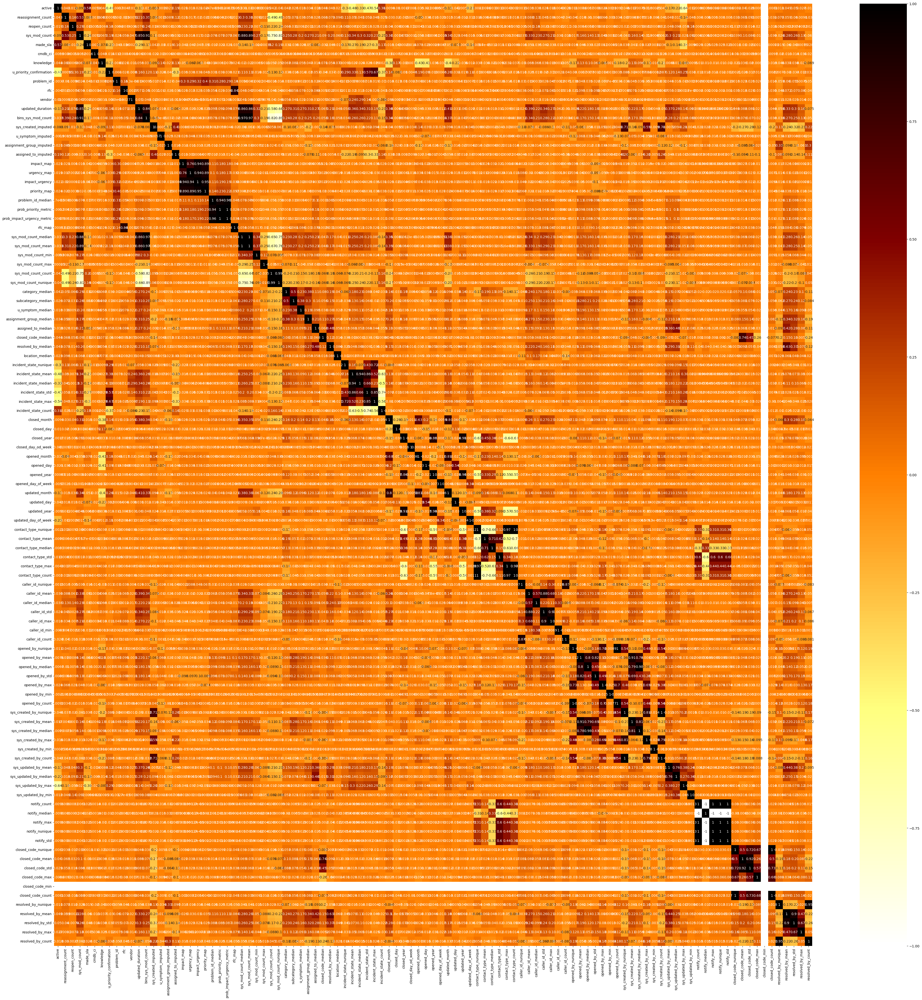

In [170]:
plt.figure(figsize=(50,50))
sns.heatmap(combined.corr(),annot=True,cmap='afmhot_r')
plt.show()

<AxesSubplot:>

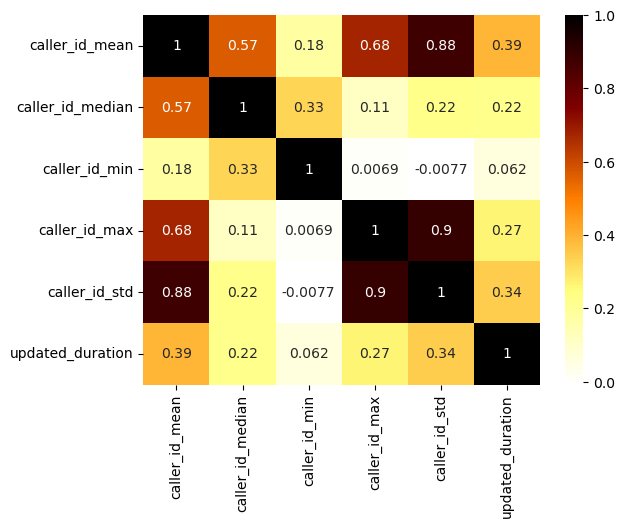

In [171]:
sns.heatmap(combined[['caller_id_mean','caller_id_median','caller_id_min','caller_id_max','caller_id_std','updated_duration']].corr(),annot=True,cmap='afmhot_r')

<AxesSubplot:>

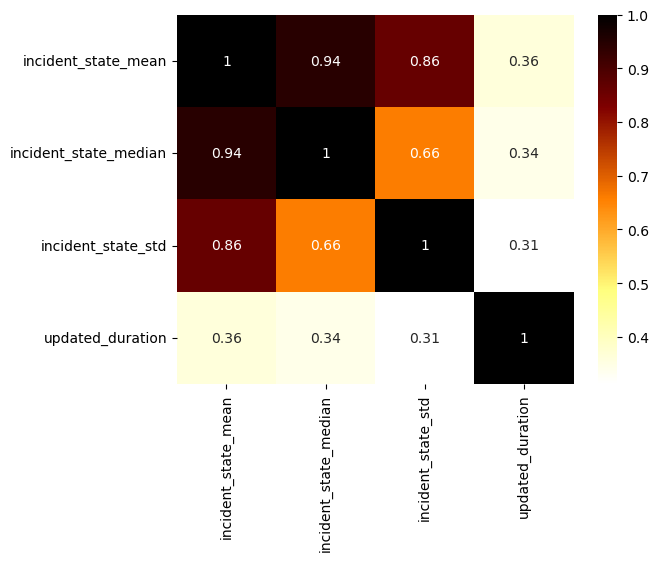

In [172]:
sns.heatmap(combined[['incident_state_mean','incident_state_median','incident_state_std','updated_duration']].corr(),annot=True,cmap='afmhot_r')

<AxesSubplot:>

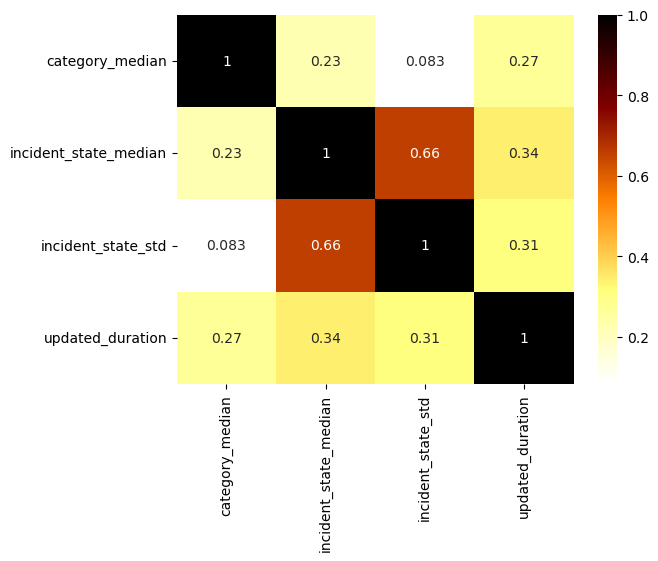

In [173]:
sns.heatmap(combined[['category_median','incident_state_median','incident_state_std','updated_duration']].corr(),annot=True,cmap='afmhot_r')

In [174]:
#category: encoding - target, median, mean
#subcategory: encoding - target, median, mean
#u_symptom: encoding - target, median, mean
#assignment_group: encoding - target, median, mean
#assigned_to: encoding - target, median, mean
#closed_code: encoding - target, median, mean, std
#resolved_by: encoding - target, median, mean
#location: encoding - target, median, mean

In [175]:
#plt.figure(figsize=(15,15))
#sns.heatmap(df_try.corr(),annot=True,cmap='afmhot_r')
#plt.show()

In [176]:
combined.shape

(141596, 127)

In [177]:
combined.columns.get_loc('updated_duration')

35

In [178]:
combined.columns[95]

'opened_by_mean'

In [179]:
combined.shape

(141596, 127)

In [180]:
combined.iloc[:,[35, 95, 96, 97,  98,  99, 100, 101, 102, 103, 104, 105, 106, 107, 108,
        109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121,
        122, 123, 124, 125, 126]].head()

,updated_duration,opened_by_mean,opened_by_median,opened_by_std,opened_by_max,opened_by_min,opened_by_count,sys_created_by_nunique,sys_created_by_mean,sys_created_by_median,sys_created_by_max,sys_created_by_min,sys_created_by_count,sys_updated_by_mean,sys_updated_by_median,sys_updated_by_max,sys_updated_by_min,notify_count,notify_median,notify_max,notify_nunique,notify_std,closed_code_nunique,closed_code_mean,closed_code_std,closed_code_max,closed_code_min,closed_code_count,resolved_by_nunique,resolved_by_mean,resolved_by_std,resolved_by_max,resolved_by_count
695,0.203472,0.793495,0.032292,1.981392,8.021528,0.001389,30,27,0.793495,0.032292,8.021528,0.001389,30,15.511298,4.957986,139.927778,0.001389,113271,1.011806,341.275694,23977,17.917007,1764,7.117519,17.936838,309.762500,0.0,2628,107,13.634204,29.843565,210.065278,134
113446,6.052083,6.561082,1.030903,17.930812,330.155556,0.000000,36988,15544,5.682202,0.890278,339.199306,0.000000,61944,8.964103,5.043750,341.275694,0.000000,113271,1.011806,341.275694,23977,17.917007,4356,4.400100,8.052414,113.914583,0.0,10832,379,4.292274,10.368315,113.914583,529
32153,0.000694,3.270762,0.106250,7.185216,125.075000,0.000000,2098,737,3.064856,0.057639,125.075000,0.000000,1813,0.832418,0.002083,194.963194,0.000000,113271,1.011806,341.275694,23977,17.917007,18629,7.219898,20.258709,339.199306,0.0,69777,330,1.918509,3.499330,51.094444,1238
113721,0.970139,14.977679,5.073958,18.621397,56.931250,0.002083,42,34,14.977679,5.073958,56.931250,0.002083,42,1.432309,0.030903,52.897917,0.000694,113271,1.011806,341.275694,23977,17.917007,18629,7.219898,20.258709,339.199306,0.0,69777,1511,2.586886,6.121306,244.025694,3047
75580,0.013194,6.294063,0.902778,18.755759,259.281944,0.000000,5814,1899,8.197254,1.129167,259.281944,0.000694,3138,1.162247,0.010417,88.698611,0.000694,113271,1.011806,341.275694,23977,17.917007,2233,5.601388,10.965100,121.002778,0.0,3603,1256,3.818073,7.300325,58.982639,1820


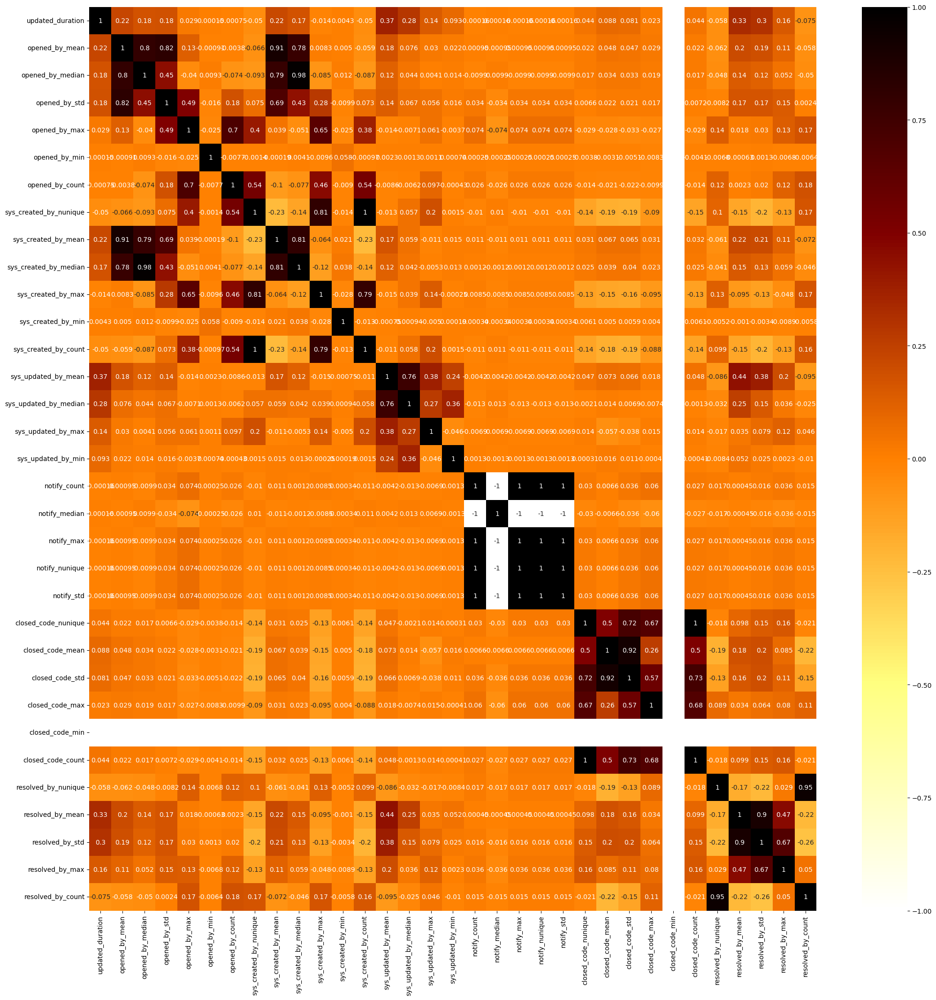

In [181]:
plt.figure(figsize=(25,25))
sns.heatmap(combined.iloc[:,[35, 95, 96, 97,  98,  99, 100, 101, 102, 103, 104, 105, 106, 107, 108,
        109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121,
        122, 123, 124, 125, 126]].corr(),annot=True,cmap='afmhot_r')
plt.show()

In [182]:
corr_mat=combined.iloc[:,[35, 97,  98,  99, 100, 101, 102, 103, 104, 105, 106, 107, 108,
        109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121,
        122, 123, 124, 125, 126]].corr()

In [183]:
corr_mat[(corr_mat.updated_duration>0.1) | (corr_mat.updated_duration<-0.1)].index

Index(['updated_duration', 'opened_by_std', 'sys_created_by_mean',
       'sys_created_by_median', 'sys_updated_by_mean', 'sys_updated_by_median',
       'sys_updated_by_max', 'resolved_by_mean', 'resolved_by_std',
       'resolved_by_max'],
      dtype='object')

In [184]:
list_corr_cols=['updated_duration', 'resolved_by_mean', 'resolved_by_median',
       'resolved_by_std', 'resolved_by_max', 'category_median',
       'subcategory_median', 'u_symptom_median', 'assignment_group_median',
       'assigned_to_median', 'caller_id_mean', 'caller_id_median',
       'caller_id_std', 'caller_id_max', 'sys_updated_by_mean',
       'sys_updated_by_median', 'sys_updated_by_max']

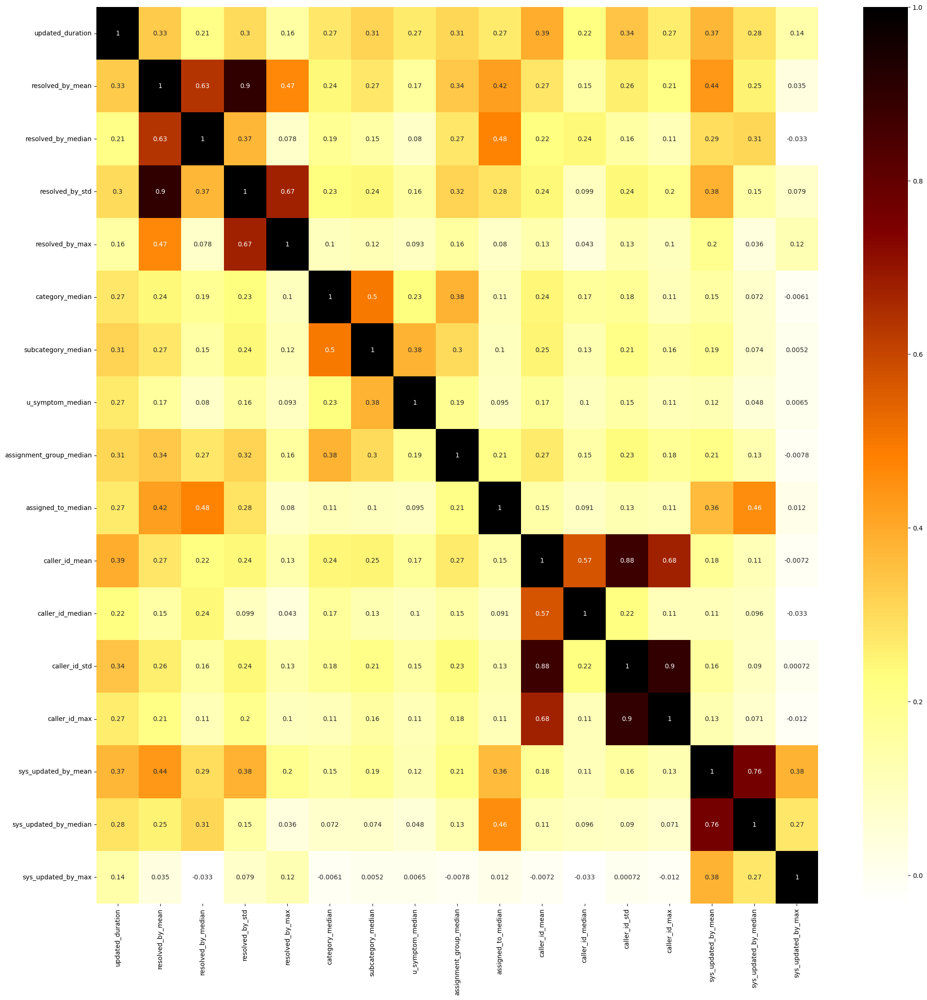

In [185]:
plt.figure(figsize=(25,25))
sns.heatmap(combined.loc[:,list_corr_cols].corr(),annot=True,cmap='afmhot_r')
plt.show()

In [186]:
corr_mat2=combined.iloc[:,range(35,95)].corr()

In [187]:
corr_mat2[(corr_mat2.updated_duration<-0.1) | (corr_mat2.updated_duration>0.1)].index

Index(['updated_duration', 'bins_sys_mod_count', 'sys_mod_count_median',
       'sys_mod_count_mean', 'sys_mod_count_min', 'sys_mod_count_max',
       'sys_mod_count_count', 'sys_mod_count_nunique', 'category_median',
       'subcategory_median', 'u_symptom_median', 'assignment_group_median',
       'assigned_to_median', 'resolved_by_median', 'incident_state_mean',
       'incident_state_median', 'incident_state_std', 'incident_state_max',
       'incident_state_count', 'closed_month', 'updated_month',
       'caller_id_mean', 'caller_id_median', 'caller_id_std', 'caller_id_max'],
      dtype='object')

In [188]:
list_corr_cols2=['updated_duration', 'bins_sys_mod_count', 'sys_mod_count_median',
       'sys_mod_count_mean', 'sys_mod_count_min', 'sys_mod_count_max',
       'sys_mod_count_count', 'sys_mod_count_nunique', 'incident_state_mean',
       'incident_state_median', 'incident_state_std', 'incident_state_max',
       'incident_state_count', 'closed_month', 'updated_month',
       'opened_by_mean', 'opened_by_median', 'opened_by_std',
       'sys_created_by_mean', 'sys_created_by_median']

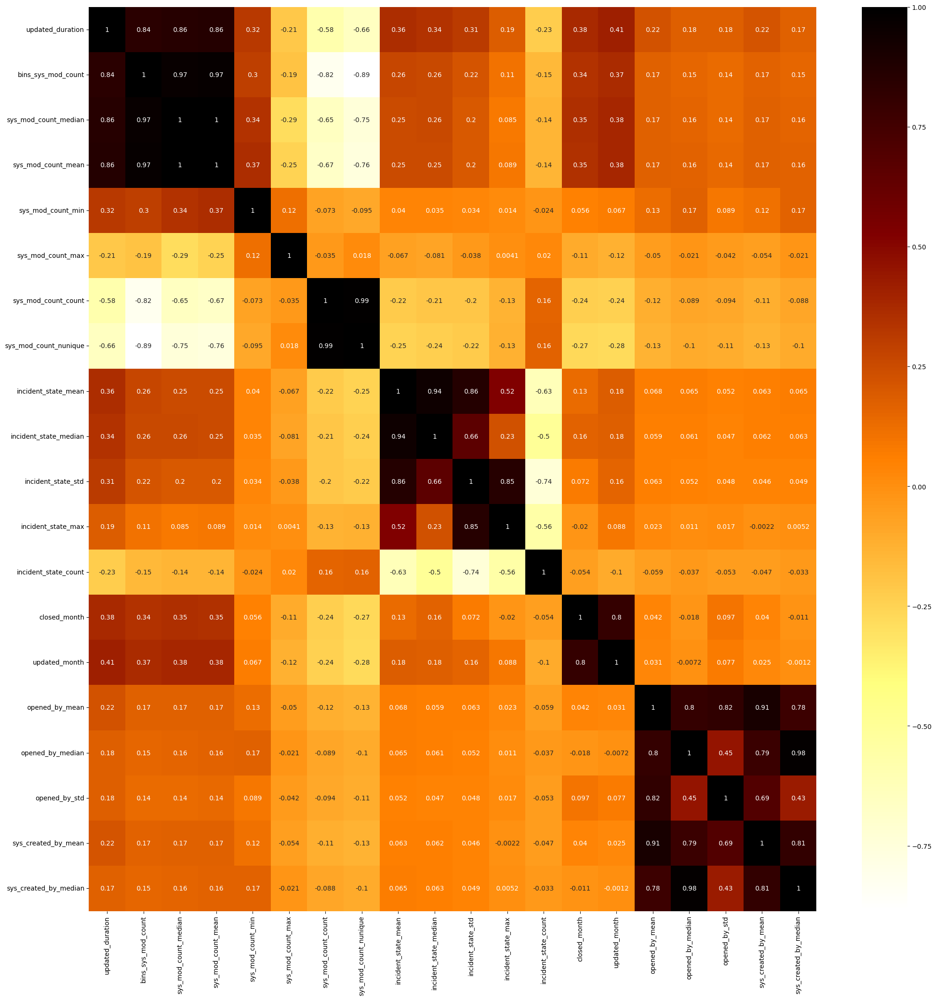

In [189]:
plt.figure(figsize=(25,25))
sns.heatmap(combined.loc[:,list_corr_cols2].corr(),annot=True,cmap='afmhot_r')
plt.show()

In [190]:
list_cols_model=list(['assigned_to_median',
 'assignment_group_median',
 'bins_sys_mod_count',
 'caller_id_max',
 'caller_id_mean',
 'caller_id_median',
 'caller_id_std',
 'category_median',
 'closed_month',
 'incident_state_count',
 'incident_state_max',
 'incident_state_mean',
 'incident_state_median',
 'incident_state_std',
 'opened_by_mean',
 'opened_by_median',
 'opened_by_std',
 'resolved_by_max',
 'resolved_by_mean',
 'resolved_by_median',
 'resolved_by_std',
 'subcategory_median',
 'sys_created_by_mean',
 'sys_created_by_median',
 'sys_mod_count_count',
 'sys_mod_count_max',
 'sys_mod_count_mean',
 'sys_mod_count_median',
 'sys_mod_count_min',
 'sys_mod_count_nunique',
 'sys_updated_by_max',
 'sys_updated_by_mean',
 'sys_updated_by_median',
 'u_symptom_median',
 'updated_duration',
 'updated_month'])
list_cols_model

['assigned_to_median',
 'assignment_group_median',
 'bins_sys_mod_count',
 'caller_id_max',
 'caller_id_mean',
 'caller_id_median',
 'caller_id_std',
 'category_median',
 'closed_month',
 'incident_state_count',
 'incident_state_max',
 'incident_state_mean',
 'incident_state_median',
 'incident_state_std',
 'opened_by_mean',
 'opened_by_median',
 'opened_by_std',
 'resolved_by_max',
 'resolved_by_mean',
 'resolved_by_median',
 'resolved_by_std',
 'subcategory_median',
 'sys_created_by_mean',
 'sys_created_by_median',
 'sys_mod_count_count',
 'sys_mod_count_max',
 'sys_mod_count_mean',
 'sys_mod_count_median',
 'sys_mod_count_min',
 'sys_mod_count_nunique',
 'sys_updated_by_max',
 'sys_updated_by_mean',
 'sys_updated_by_median',
 'u_symptom_median',
 'updated_duration',
 'updated_month']

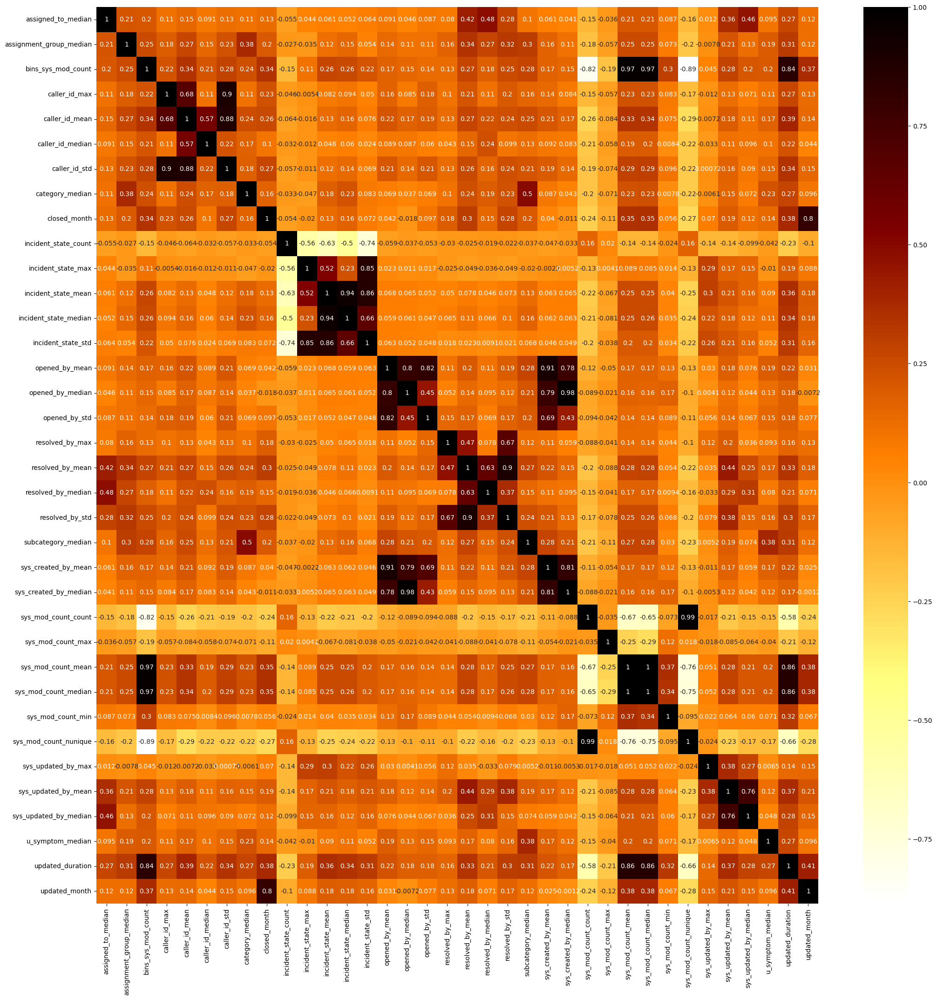

In [191]:
plt.figure(figsize=(25,25))
sns.heatmap(combined.loc[:,list_cols_model].corr(),annot=True,cmap='afmhot_r')
plt.show()

In [192]:
list_1each_model=['updated_duration','sys_mod_count_mean','updated_month','caller_id_mean','closed_month',
                  'sys_updated_by_mean','incident_state_mean','resolved_by_mean','subcategory_median',
                  'assignment_group_median','category_median','u_symptom_median','assigned_to_median','opened_by_mean',
                  'sys_created_by_mean','resolved_by_max']

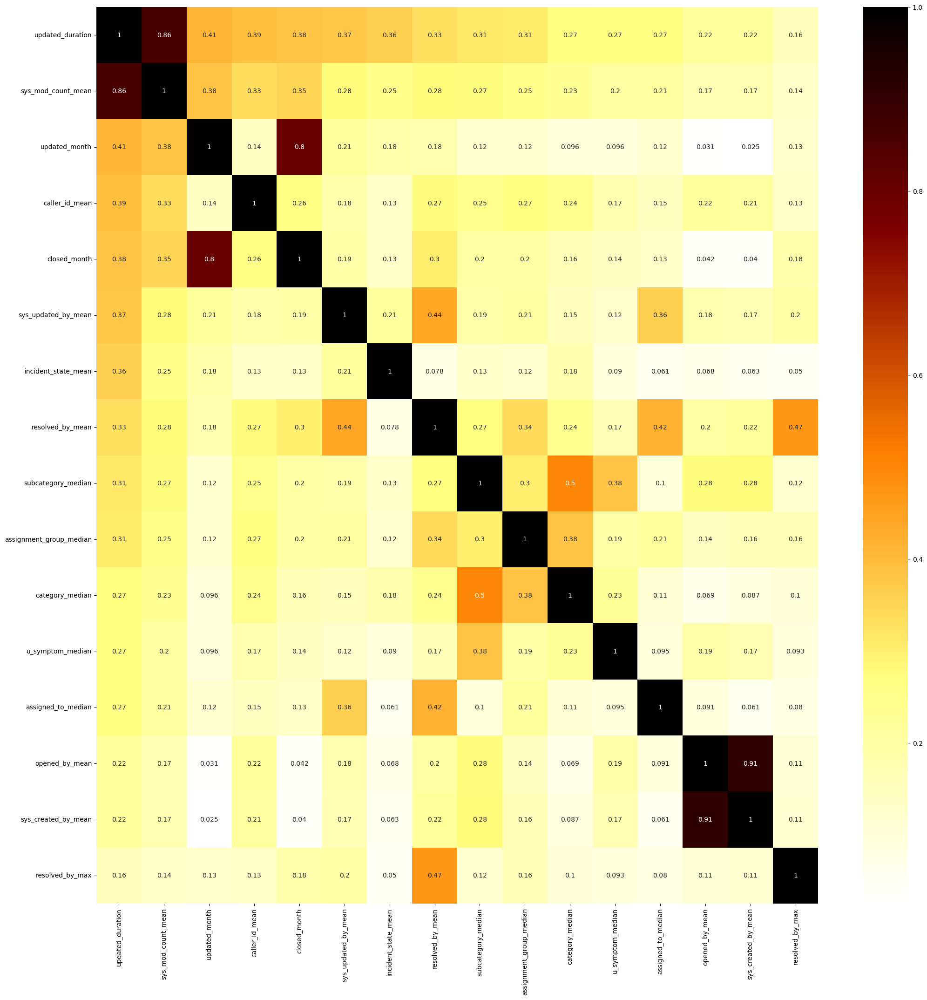

In [236]:
plt.figure(figsize=(25,25))
sns.heatmap(combined.loc[:,list_1each_model].corr(),annot=True,cmap='afmhot_r')
plt.show()

### Model Building:
* with 5 fold Cross Validation

In [193]:
from sklearn.linear_model import LinearRegression

In [194]:
from sklearn.metrics import mean_absolute_error

In [195]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()

In [196]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

In [197]:
from sklearn.model_selection import KFold

kfold=KFold(n_splits=5,shuffle=True, random_state=42)

In [198]:
from sklearn.tree import DecisionTreeRegressor

In [199]:
from sklearn.neighbors import KNeighborsRegressor

In [200]:
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor, StackingRegressor, VotingRegressor

In [201]:
from sklearn.model_selection import GridSearchCV

In [202]:
from xgboost import XGBRegressor

* Mean Model:

In [203]:
y_pred_mean=list()
for i in range(len(y_test_final)):
    y_pred_mean.append(ytrain.mean())
y_pred_mean=pd.Series(y_pred_mean)

In [204]:
print('Mean Model RMSE:',np.sqrt(mean_squared_error(y_test_final,y_pred_mean)))
print('Mean Model MAE:',mean_absolute_error(y_test_final,y_pred_mean))
print('Mean Model R-squared:', r2_score(y_test_final,y_pred_mean))

Mean Model RMSE: 18.83234406931907
Mean Model MAE: 7.994502047525849
Mean Model R-squared: -0.00010530133753117177


In [205]:
df_try=newtrain.copy()

In [206]:
df_try.head()

,number,incident_state,active,reassignment_count,reopen_count,sys_mod_count,made_sla,caller_id,opened_by,opened_at,sys_created_by,sys_created_at,sys_updated_by,sys_updated_at,contact_type,location,category,subcategory,u_symptom,cmdb_ci,impact,urgency,priority,assignment_group,assigned_to,knowledge,u_priority_confirmation,notify,problem_id,rfc,vendor,closed_code,resolved_by,resolved_at,closed_at,updated_duration,bins_sys_mod_count,sys_created_imputed,u_symptom_imputed,assignment_group_imputed,assigned_to_imputed,impact_map,urgency_map,impact_urgency,priority_map,problem_id_median,prob_priority_metric,prob_impact_urgency_metric,rfc_map,sys_mod_count_median,sys_mod_count_mean,sys_mod_count_min,sys_mod_count_max,sys_mod_count_count,sys_mod_count_nunique,category_median,subcategory_median,u_symptom_median,assignment_group_median,assigned_to_median,closed_code_median,resolved_by_median,location_median,incident_state_nunique,incident_state_mean,incident_state_median,incident_state_std,incident_state_max,incident_state_count,closed_month,closed_day,closed_year,closed_day_od_week,opened_month,opened_day,opened_year,opened_day_of_week,updated_month,updated_day,updated_year,updated_day_of_week,contact_type_nunique,contact_type_mean,contact_type_median,contact_type_std,contact_type_max,contact_type_count,caller_id_nunique,caller_id_mean,caller_id_median,caller_id_std,caller_id_max,caller_id_min,caller_id_count,opened_by_nunique,opened_by_mean,opened_by_median,opened_by_std,opened_by_max,opened_by_min,opened_by_count,sys_created_by_nunique,sys_created_by_mean,sys_created_by_median,sys_created_by_max,sys_created_by_min,sys_created_by_count,sys_updated_by_mean,sys_updated_by_median,sys_updated_by_max,sys_updated_by_min,notify_count,notify_median,notify_max,notify_nunique,notify_std,closed_code_nunique,closed_code_mean,closed_code_std,closed_code_max,closed_code_min,closed_code_count,resolved_by_nunique,resolved_by_mean,resolved_by_std,resolved_by_max,resolved_by_count
695,INC0000261,Closed,0,0,0,7,1,1393,128,2016-02-29 12:54:00,67,2016-02-29 12:58:00,300,2016-02-29 17:47:00,Phone,197,42,31,273,-1,1 - High,1 - High,1 - Critical,3,71,1,1,Do Not Notify,0,-1,-1,1,64,2016-02-29 17:47:00,2016-02-29 17:47:00,0.203472,1,0,0,0,0,2,2,4,3,0.043750,0.131250,0.175000,0,0.671528,3.31464,0.0,266.911111,103311,17938,0.140972,2.105556,1.009722,2.852083,1.029861,2.320139,0.407986,2.998958,9424,13.142594,6.072917,22.207705,341.275694,19968,2,29,2016,0,2,29,2016,0,2,29,2016,0,23827,6.462023,1.011806,17.904105,341.275694,112373,41,2.035764,0.032292,3.260510,13.404167,0.000000,48,27,0.793495,0.032292,1.981392,8.021528,0.001389,30,27,0.793495,0.032292,8.021528,0.001389,30,15.511298,4.957986,139.927778,0.001389,113271,1.011806,341.275694,23977,17.917007,1764,7.117519,17.936838,309.762500,0.0,2628,107,13.634204,29.843565,210.065278,134
113446,INC0027507,Closed,0,1,0,7,1,4671,17,2016-05-09 13:52:00,10,2016-05-09 13:57:00,908,2016-05-15 15:07:00,Phone,161,42,223,491,-1,2 - Medium,2 - Medium,3 - Moderate,55,214,0,1,Do Not Notify,-1,-1,-1,9,195,2016-05-10 15:03:00,2016-05-15 15:07:00,6.052083,1,0,1,0,0,1,1,2,1,1.009028,1.009028,2.018056,0,0.671528,3.31464,0.0,266.911111,103311,17938,0.140972,0.086806,0.996528,0.295833,0.328125,0.949306,0.704167,0.740972,9424,13.142594,6.072917,22.207705,341.275694,19968,5,15,2016,6,5,9,2016,0,5,15,2016,6,23827,6.462023,1.011806,17.904105,341.275694,112373,20,1.625095,0.683333,2.240016,6.052083,0.001389,22,11698,6.561082,1.030903,17.930812,330.155556,0.000000,36988,15544,5.682202,0.890278,339.199306,0.000000,61944,8.964103,5.043750,341.275694,0.000000,113271,1.011806,341.275694,23977,17.917007,4356,4.400100,8.052414,113.914583,0.0,10832,379,4.292274,10.368315,113.914583,529
32153,INC0007220,Active,1,0,0,0,1,1904,180,2016-03-15 11:27:00,81,2016-03-15 11:28:00,340,2016-03-15 11:28:00,Phone,125,51,174,491,-1,2 - Medium,2 - Medium,3 - Moderate,64,94,0,0,Do Not Notify,-1,-1,-1,6,85,2016-03-15 11:32:00,2016-03-24 19:01:00,0.000694,1,0,0,0,0,1,

In [207]:
df_try=df_try.loc[:,list_1each_model]

In [208]:
df_try.head()

,updated_duration,sys_mod_count_mean,updated_month,caller_id_mean,closed_month,sys_updated_by_mean,incident_state_mean,resolved_by_mean,subcategory_median,assignment_group_median,category_median,u_symptom_median,assigned_to_median,opened_by_mean,sys_created_by_mean,resolved_by_max
695,0.203472,3.31464,2,2.035764,2,15.511298,13.142594,13.634204,2.105556,2.852083,0.140972,1.009722,1.029861,0.793495,0.793495,210.065278
113446,6.052083,3.31464,5,1.625095,5,8.964103,13.142594,4.292274,0.086806,0.295833,0.140972,0.996528,0.328125,6.561082,5.682202,113.914583
32153,0.000694,3.31464,3,1.837393,3,0.832418,4.647457,1.918509,0.857292,0.004861,0.145486,0.996528,0.006944,3.270762,3.064856,51.094444
113721,0.970139,3.31464,5,1.535851,5,1.432309,4.647457,2.586886,0.086806,0.953819,0.140972,0.009028,0.220486,14.977679,14.977679,244.025694
75580,0.013194,3.31464,4,2.294147,4,1.162247,1.146077,3.818073,2.939931,1.046528,1.188889,1.064583,0.942361,6.294063,8.197254,58.982639


In [209]:
Xtrain=df_try.drop(columns=['updated_duration'])
ytrain=df_try.updated_duration

In [210]:
Xtest=newtest.loc[:,list_1each_model]
Xtest.drop('updated_duration',axis=1,inplace=True)
ytest=df.loc[test_index,'updated_duration']

In [211]:
for i in Xtrain.columns:
    Xtrain.loc[:,i]=sc.fit_transform(pd.DataFrame(Xtrain.loc[:,i]))
    Xtest.loc[:,i]=sc.transform(pd.DataFrame(Xtest.loc[:,i]))

In [212]:
Xtrain.shape, Xtest.shape, ytrain.shape, ytest.shape

((113366, 15), (28230, 15), (113366,), (28230,))

In [213]:
def model_results(model,Xtrain,ytrain,Xtest,ytest):

    pred_train=[]
    pred_test=[]
    for train_index,test_index in kfold.split(Xtrain,ytrain):
        Xtrain_new=Xtrain.iloc[train_index]
        ytrain_new=ytrain.iloc[train_index]
        pred_train.append(model.fit(Xtrain_new,ytrain_new).predict(Xtrain))
        pred_test.append(model.fit(Xtrain_new,ytrain_new).predict(Xtest))
    
    y_pred_train=pd.DataFrame(pred_train).T.mean(axis=1)
    y_pred_test=pd.DataFrame(pred_test).T.mean(axis=1)

    mae_train=mean_absolute_error(ytrain,y_pred_train)
    mae_test=mean_absolute_error(ytest,y_pred_test)

    rmse_train=np.sqrt(mean_squared_error(ytrain,y_pred_train))
    rmse_test=np.sqrt(mean_squared_error(ytest,y_pred_test))
    
    r2_train=r2_score(ytrain,y_pred_train)
    r2_test=r2_score(ytest,y_pred_test)
    
    print('Train RMSE:',rmse_train, 'Test RMSE:',rmse_test)
    print('Train MAE:',mae_train, 'Test MAE:',mae_test)
    print('Train R-squared:',r2_train, 'Test R-squared:', r2_test)

* Linear Regression Model:

In [214]:
model=LinearRegression()

In [215]:
model_results(model,Xtrain,ytrain,Xtest,ytest)

Train RMSE: 7.963778434246315 Test RMSE: 8.00504375993756
Train MAE: 4.049082673102014 Test MAE: 4.115932535480628
Train R-squared: 0.8022905880584774 Test R-squared: 0.8192974048452033


* Decision Tree:

In [216]:
model_dt=DecisionTreeRegressor()

In [217]:
model_results(model_dt,Xtrain,ytrain,Xtest,ytest)

Train RMSE: 1.3433148216069015 Test RMSE: 4.630818774398349
Train MAE: 0.5501891428301681 Test MAE: 2.0706172755777925
Train R-squared: 0.9943747138385763 Test R-squared: 0.9395282496076476


* KNN Model:

In [218]:
model_knn=KNeighborsRegressor()

In [219]:
model_results(model_knn,Xtrain,ytrain,Xtest,ytest)

Train RMSE: 4.9730594954623735 Test RMSE: 6.129447169590689
Train MAE: 2.14129389935646 Test MAE: 2.6350008895186368
Train R-squared: 0.9229032063237104 Test R-squared: 0.8940552156430459


* AdaBoost Model

In [220]:
model_ada=AdaBoostRegressor()

In [221]:
model_results(model_ada,Xtrain,ytrain,Xtest,ytest)

Train RMSE: 10.935515864163383 Test RMSE: 11.325851910269286
Train MAE: 9.315047819154763 Test MAE: 9.720610842464179
Train R-squared: 0.6272071648996165 Test R-squared: 0.6382748323988501


* Random Forest Model:

In [222]:
model_rf=RandomForestRegressor()

In [223]:
model_results(model_rf,Xtrain,ytrain,Xtest,ytest)

Train RMSE: 2.1749910923509232 Test RMSE: 4.480422280701292
Train MAE: 1.0186923108364527 Test MAE: 2.054714880342254
Train R-squared: 0.9852529900858173 Test R-squared: 0.9433923839529578


* Gradient Boosting Model:

In [224]:
model_gb=GradientBoostingRegressor()

In [225]:
model_results(model_gb,Xtrain,ytrain,Xtest,ytest)

Train RMSE: 5.565886667714914 Test RMSE: 5.78836266850569
Train MAE: 3.0199819253408973 Test MAE: 3.101863935713402
Train R-squared: 0.9034265547863026 Test R-squared: 0.9055181394571192


* XGBoost Model:

In [226]:
model_xgb=XGBRegressor()

In [227]:
model_results(model_xgb,Xtrain,ytrain,Xtest,ytest)

Train RMSE: 3.6349287103492416 Test RMSE: 4.47066574936903
Train MAE: 2.165425263637352 Test MAE: 2.4094882562994013
Train R-squared: 0.9588110422770316 Test R-squared: 0.9436386520989456


* **GridSearch CV for hyperparameter tuning for the best performing model: XGBoost**

In [228]:
xgb = XGBRegressor(random_state=0,n_jobs=-1)

#Define the hyperparameter grid to search over
param_grid = {'max_depth': [10, 15, 20],
                'learning_rate':[0.1, 0.2, 0.3]
}

#Perform a grid search to find the best hyperparameters
grid_search = GridSearchCV(estimator=xgb, param_grid=param_grid, cv=3, scoring='neg_mean_absolute_error', n_jobs=-1)
grid_search.fit(Xtrain, ytrain)

#Print the best hyperparameters found by the grid search
print("Best Hyperparameters:", grid_search.best_params_)

Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 15}


* **Final Model: XGBoost with Hyperparameter Tuning:**

In [229]:
final_model=XGBRegressor(learning_rate=grid_search.best_params_['learning_rate'],
                         max_depth=grid_search.best_params_['max_depth'])

In [230]:
model_results(final_model,Xtrain,ytrain,Xtest,ytest)

Train RMSE: 1.3040293110704035 Test RMSE: 3.9507846878928654
Train MAE: 0.682406025796137 Test MAE: 1.7707736160383483
Train R-squared: 0.9946989278711458 Test R-squared: 0.9559846973107908


In [231]:
#Improvement from Mean Model: with hyperparameter tuning
print('Mean Model MAE:', np.round(mean_absolute_error(y_test_final,y_pred_mean),2),'\t\t',
      'Mean Model RMSE:',np.round(np.sqrt(mean_squared_error(y_test_final,y_pred_mean)),2))
print('XGBoost Model MAE: 1.77 \t XGBoost Model RMSE: 3.95')

Mean Model MAE: 7.99 		 Mean Model RMSE: 18.83
XGBoost Model MAE: 1.77 	 XGBoost Model RMSE: 3.95


In [232]:
#Improvement from Mean Model: without hyperparameter tuning
print('Mean Model MAE:', np.round(mean_absolute_error(y_test_final,y_pred_mean),2),'\t\t'
      'Mean Model RMSE:',np.round(np.sqrt(mean_squared_error(y_test_final,y_pred_mean)),2))
print('XGBoost Model MAE: 2.40 \tXGBoost Model RMSE: 4.47')

Mean Model MAE: 7.99 		Mean Model RMSE: 18.83
XGBoost Model MAE: 2.40 	XGBoost Model RMSE: 4.47
